In [ ]:
Import Modules

In [1]:
!pip install prophet


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 12.4 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.2/83.2 kB 8.0 MB/s eta 0:00:00
  Using cached LunarCalendar-0.0.9-py2.py3-none-any.whl (18 kB)


In [5]:
!pip install tqdm

In [6]:
# Python
import pandas as pd
from prophet import Prophet
import tqdm as notebook_tqdm

In [148]:
least_restricted = pd.read_csv('../data/least_restricted.csv')

In [177]:
least_restricted.columns



Index(['week', 'depression', 'anxiety', 'addiction', 'counselling',
       'mental_health', 'stay_at_home', 'mask_mandate', 'gatherings_banned',
       'business_closures', 'travel_restrictions'],
      dtype='object')

In [20]:
most_restricted = pd.read_csv('../data/most_restricted.csv')

In [52]:
most_restricted

,week,depression,anxiety,addiction,counselling,mental_health,stay_at_home,mask_mandate,gatherings_banned,business_closures,travel_restrictions
0,2017-12-31,53.0,65.8,26.4,32.2,23.8,0.0,0.0,0.0,0.0,0.0
1,2018-01-07,58.0,66.0,26.0,40.4,33.8,0.0,0.0,0.0,0.0,0.0
2,2018-01-14,54.2,60.6,22.8,41.0,35.2,0.0,0.0,0.0,0.0,0.0
3,2018-01-21,63.4,65.2,21.6,38.0,33.2,0.0,0.0,0.0,0.0,0.0
4,2018-01-28,66.8,63.2,23.6,36.4,30.4,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
257,2022-12-04,59.8,76.2,21.8,31.4,55.4,0.0,0.0,0.0,0.0,0.0
258,2022-12-11,61.4,67.8,22.0,39.6,46.2,0.0,0.0,0.0,0.0,0.0
259,2022-12-18,49.8,68.4,19.4,29.0,39.0,0.0,0.0,0.0,0.0,0.0
260,2022-12-25,32.0,70.6,18.8,22.2,29.8,0.0,0.0,0.0,0.0,0.0


In [26]:
most_depression.columns

Index(['ds', 'y', 'anxiety', 'addiction', 'counselling', 'mental_health',
       'stay_at_home', 'mask_mandate', 'gatherings_banned',
       'business_closures', 'travel_restrictions'],
      dtype='object')

In [109]:
most_depression = most_restricted.rename(columns={'week': 'ds', 'depression': 'y'})

In [127]:
most_depression.drop(['anxiety', 'addiction', 'counselling', 'mental_health',
       'stay_at_home', 'mask_mandate', 'gatherings_banned',
       'business_closures', 'travel_restrictions'],axis=1,inplace = True)

In [110]:
most_anxiety = most_restricted.rename(columns={'week': 'ds', 'anxiety': 'y'})

In [114]:
most_anxiety.columns

Index(['ds', 'depression', 'y', 'addiction', 'counselling', 'mental_health',
       'stay_at_home', 'mask_mandate', 'gatherings_banned',
       'business_closures', 'travel_restrictions'],
      dtype='object')

In [115]:
most_anxiety.drop(['depression', 'addiction', 'counselling', 'mental_health',
       'stay_at_home', 'mask_mandate', 'gatherings_banned',
       'business_closures', 'travel_restrictions'],axis=1,inplace = True)

In [111]:
most_addiction = most_restricted.rename(columns={'week': 'ds', 'addiction': 'y'})

In [116]:
most_addiction.columns

Index(['ds', 'depression', 'anxiety', 'y', 'counselling', 'mental_health',
       'stay_at_home', 'mask_mandate', 'gatherings_banned',
       'business_closures', 'travel_restrictions'],
      dtype='object')

In [117]:
most_addiction.drop(['depression', 'anxiety', 'counselling', 'mental_health',
       'stay_at_home', 'mask_mandate', 'gatherings_banned',
       'business_closures', 'travel_restrictions'],axis=1,inplace = True)

In [112]:
most_counselling = most_restricted.rename(columns={'week': 'ds', 'counselling': 'y'})

In [118]:
most_counselling.columns

Index(['ds', 'depression', 'anxiety', 'addiction', 'y', 'mental_health',
       'stay_at_home', 'mask_mandate', 'gatherings_banned',
       'business_closures', 'travel_restrictions'],
      dtype='object')

In [119]:
most_counselling.drop([ 'depression', 'anxiety', 'addiction', 'mental_health',
       'stay_at_home', 'mask_mandate', 'gatherings_banned',
       'business_closures', 'travel_restrictions'],axis=1,inplace = True)

In [139]:
most_mental_health = most_restricted.rename(columns={'week': 'ds', 'mental_health': 'y'})

In [140]:
most_mental_health.columns

Index(['ds', 'depression', 'anxiety', 'addiction', 'counselling', 'y',
       'stay_at_home', 'mask_mandate', 'gatherings_banned',
       'business_closures', 'travel_restrictions'],
      dtype='object')

In [141]:
most_mental_health.drop([ 'depression', 'anxiety', 'addiction',  
       'stay_at_home', 'mask_mandate', 'gatherings_banned',
       'business_closures', 'travel_restrictions','counselling'],axis=1,inplace = True)

In [143]:
most_depression.head(1)

,ds,y
0,2017-12-31,53.0


In [144]:
most_anxiety.head(1)

,ds,y
0,2017-12-31,65.8


In [145]:
most_addiction.head(1)

,ds,y
0,2017-12-31,26.4


In [146]:
most_counselling.head(1)

,ds,y
0,2017-12-31,32.2


In [147]:
most_mental_health.head(1)

,ds,y
0,2017-12-31,23.8


In [ ]:
most_list [most_depression,most_anxiety,most_addiction,most_counselling,most_mental_health]

In [150]:
least_depression = least_restricted.rename(columns={'week': 'ds', 'depression': 'y'})

In [151]:
least_depression .drop(['anxiety', 'addiction', 'counselling', 'mental_health',
       'stay_at_home', 'mask_mandate', 'gatherings_banned',
       'business_closures', 'travel_restrictions'],axis=1,inplace = True)

In [152]:
least_anxiety = least_restricted.rename(columns={'week': 'ds', 'anxiety': 'y'})

In [153]:
least_anxiety.drop(['depression', 'addiction', 'counselling', 'mental_health',
       'stay_at_home', 'mask_mandate', 'gatherings_banned',
       'business_closures', 'travel_restrictions'],axis=1,inplace = True)

In [154]:
least_addiction = least_restricted.rename(columns={'week': 'ds', 'addiction': 'y'})

In [155]:
least_addiction.drop(['depression', 'anxiety', 'counselling', 'mental_health',
       'stay_at_home', 'mask_mandate', 'gatherings_banned',
       'business_closures', 'travel_restrictions'],axis=1,inplace = True)

In [156]:
least_counselling = least_restricted.rename(columns={'week': 'ds', 'counselling': 'y'})

In [157]:
least_counselling.drop([ 'depression', 'anxiety', 'addiction', 'mental_health',
       'stay_at_home', 'mask_mandate', 'gatherings_banned',
       'business_closures', 'travel_restrictions'],axis=1,inplace = True)

In [158]:
least_mental_health = least_restricted.rename(columns={'week': 'ds', 'mental_health': 'y'})

In [159]:
least_mental_health.drop([ 'depression', 'anxiety', 'addiction',  
       'stay_at_home', 'mask_mandate', 'gatherings_banned',
       'business_closures', 'travel_restrictions','counselling'],axis=1,inplace = True)

In [160]:
least_depression.head(1)

,ds,y
0,2017-12-31,47.8


In [161]:
least_anxiety.head(1)

,ds,y
0,2017-12-31,56.0


In [162]:
least_addiction.head(1)

,ds,y
0,2017-12-31,21.2


In [163]:
least_counselling.head(1)

,ds,y
0,2017-12-31,27.8


In [164]:
least_mental_health.head(1)

,ds,y
0,2017-12-31,13.6


# prophet practice

In [45]:
# Python
m = Prophet()
m.fit(most_depression)

09:21:56 - cmdstanpy - INFO - Chain [1] start processing
09:21:56 - cmdstanpy - INFO - Chain [1] done processing


In [46]:

# Python
future = m.make_future_dataframe(periods=365)
future.tail()

,ds
622,2023-12-28
623,2023-12-29
624,2023-12-30
625,2023-12-31
626,2024-01-01


In [31]:
# Python
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()



,ds,yhat,yhat_lower,yhat_upper
622,2023-12-28,43.235936,36.123678,50.073857
623,2023-12-29,43.212868,35.991309,49.860571
624,2023-12-30,43.292043,36.517540,49.830220
625,2023-12-31,43.471932,36.112237,50.321449
626,2024-01-01,43.749314,36.504026,50.516419


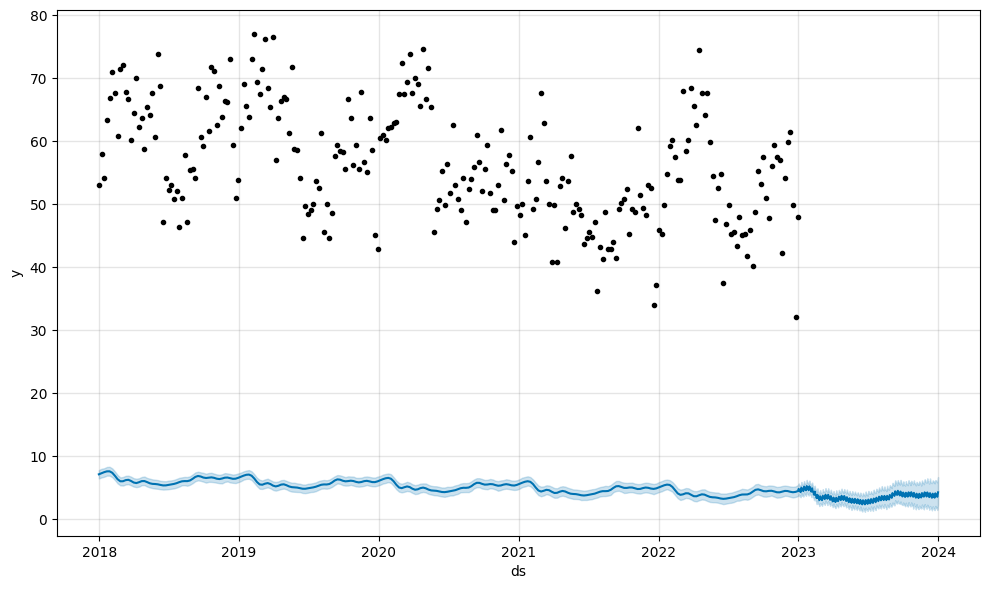

In [51]:

2
# Python
fig1 = m.plot(forecast)


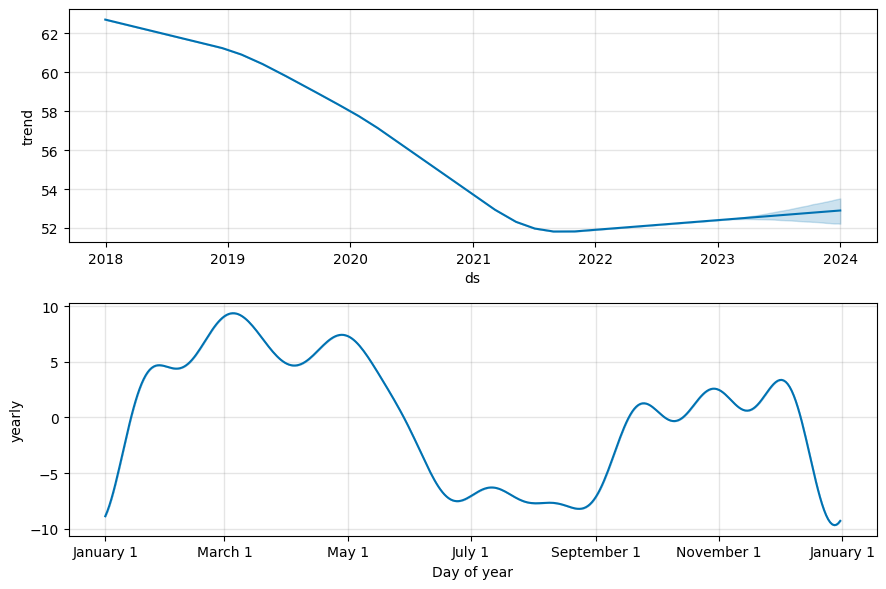

In [33]:
# Python
fig2 = m.plot_components(forecast)


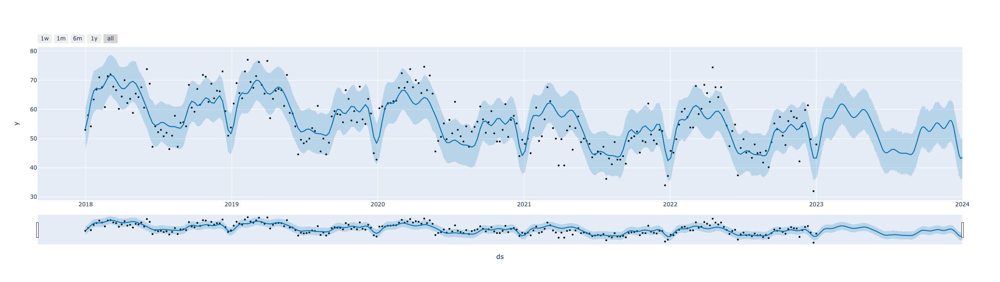

In [34]:
# Python
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(m, forecast)

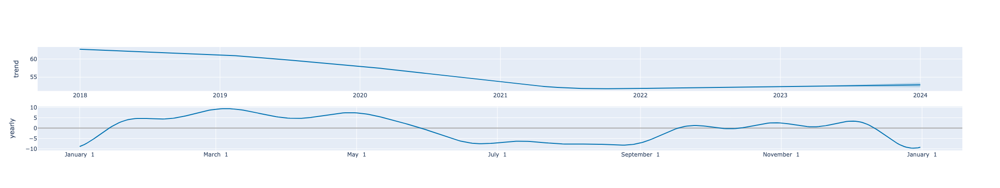

In [35]:
# Python
plot_components_plotly(m, forecast)

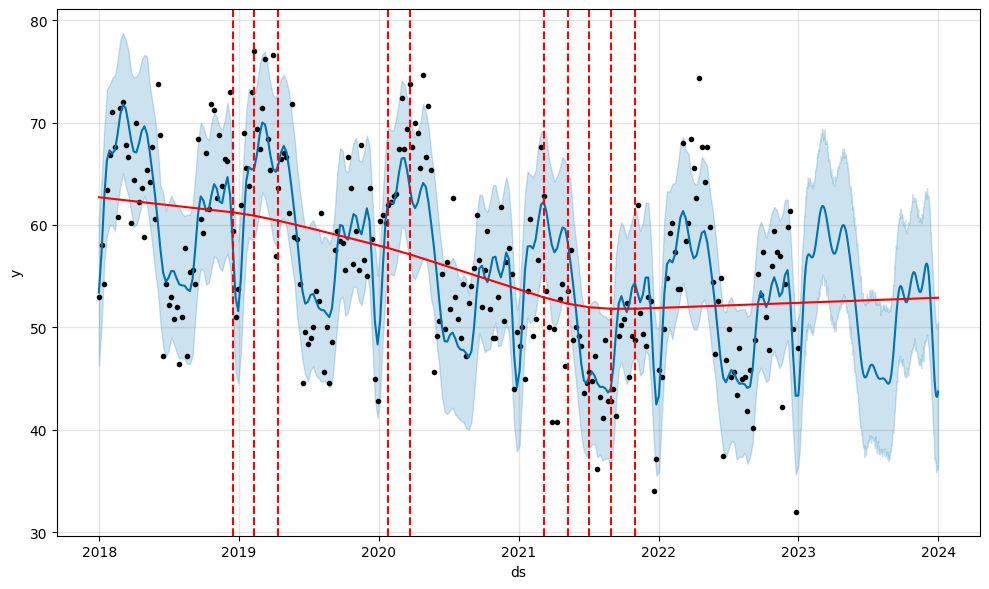

In [36]:
# Python
from prophet.plot import add_changepoints_to_plot
fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m, forecast)


09:15:48 - cmdstanpy - INFO - Chain [1] start processing
09:15:50 - cmdstanpy - INFO - Chain [1] done processing


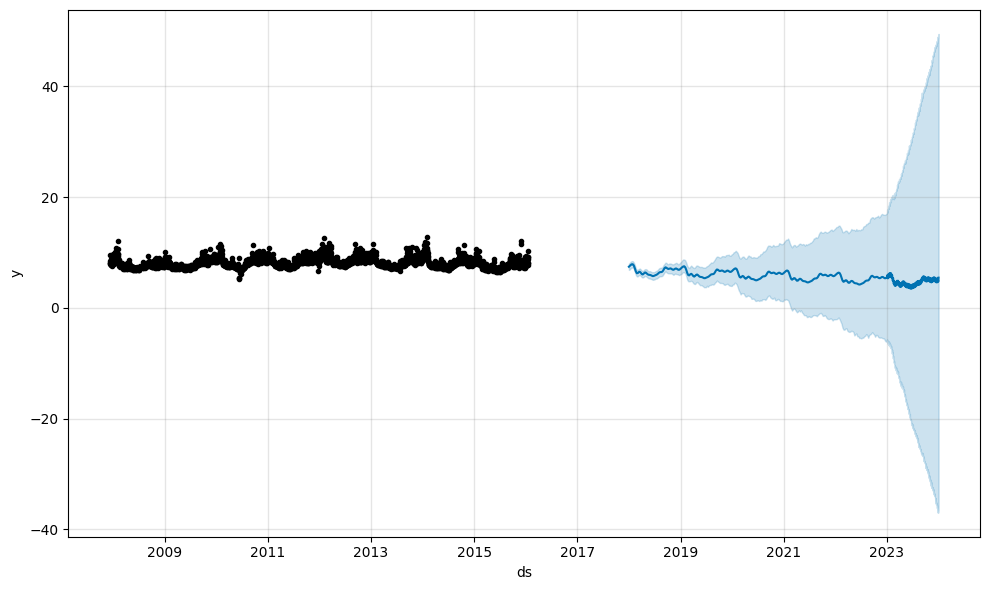

In [37]:
# Python
m = Prophet(changepoint_prior_scale=0.5)
forecast = m.fit(df).predict(future)
fig = m.plot(forecast)


09:16:17 - cmdstanpy - INFO - Chain [1] start processing
09:16:17 - cmdstanpy - INFO - Chain [1] done processing


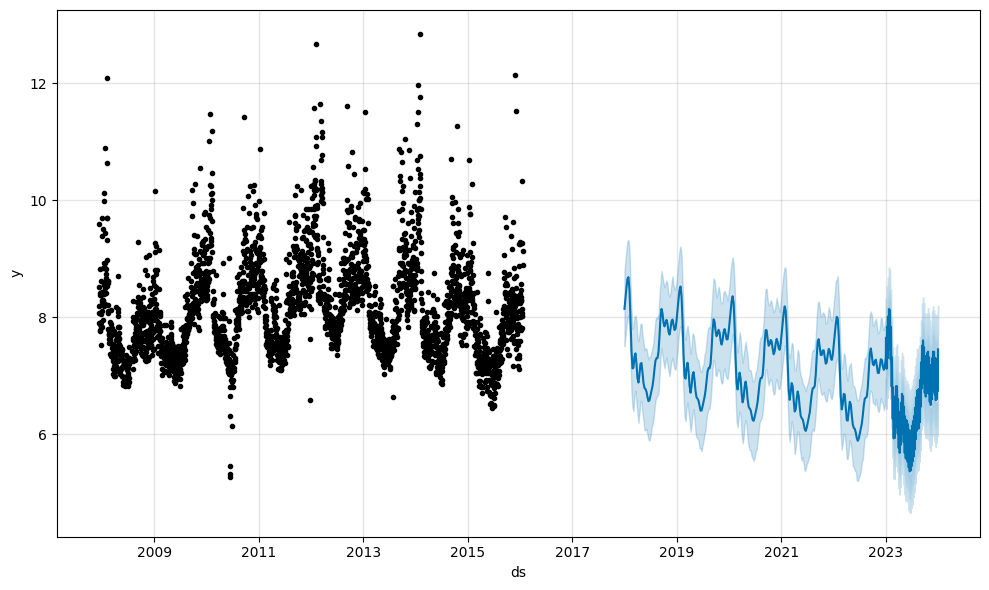

In [38]:
# Python
m = Prophet(changepoint_prior_scale=0.001)
forecast = m.fit(df).predict(future)
fig = m.plot(forecast)

In [47]:
#history test
# Python
from prophet.diagnostics import cross_validation
df_cv = cross_validation(m, initial='730 days', period='180 days', horizon = '365 days')


  0%|                                                     | 0/5 [00:00<?, ?it/s]09:25:56 - cmdstanpy - INFO - Chain [1] start processing
09:25:56 - cmdstanpy - INFO - Chain [1] done processing
 20%|█████████                                    | 1/5 [00:00<00:00,  7.69it/s]09:25:56 - cmdstanpy - INFO - Chain [1] start processing
09:25:56 - cmdstanpy - INFO - Chain [1] done processing
 40%|██████████████████                           | 2/5 [00:00<00:00,  7.76it/s]09:25:56 - cmdstanpy - INFO - Chain [1] start processing
09:25:56 - cmdstanpy - INFO - Chain [1] done processing
 60%|███████████████████████████                  | 3/5 [00:00<00:00,  8.12it/s]09:25:56 - cmdstanpy - INFO - Chain [1] start processing
09:25:56 - cmdstanpy - INFO - Chain [1] done processing
 80%|████████████████████████████████████         | 4/5 [00:00<00:00,  8.40it/s]09:25:56 - cmdstanpy - INFO - Chain [1] start processing
09:25:56 - cmdstanpy - INFO - Chain [1] done processing
100%|██████████████████████████████

In [48]:
df_cv

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2020-01-19,61.795609,55.849551,67.740012,60.2,2020-01-12
1,2020-01-26,63.859652,58.159921,69.737407,62.0,2020-01-12
2,2020-02-02,64.841915,59.144638,70.692405,62.2,2020-01-12
3,2020-02-09,65.290909,59.411598,70.870859,62.8,2020-01-12
4,2020-02-16,65.428779,59.811737,71.043150,63.0,2020-01-12
...,...,...,...,...,...,...
256,2022-12-04,43.556234,36.694954,50.364583,59.8,2022-01-01
257,2022-12-11,40.179112,33.479683,47.196198,61.4,2022-01-01
258,2022-12-18,35.117833,28.314747,42.573643,49.8,2022-01-01
259,2022-12-25,31.347727,24.694408,38.692153,32.0,2022-01-01


In [49]:
# Python
cutoffs = pd.to_datetime(['2013-02-15', '2013-08-15', '2014-02-15'])
df_cv2 = cross_validation(m, cutoffs=cutoffs, horizon='365 days')


ValueError: Minimum cutoff value is not strictly greater than min date in history

In [50]:
# Python
from prophet.diagnostics import performance_metrics
df_p = performance_metrics(df_cv)
df_p.head()

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,36 days,41.874186,6.471027,5.128884,0.099790,0.074213,0.099583,0.730769
1,37 days,39.970711,6.322239,4.876423,0.094265,0.063699,0.093563,0.769231
2,39 days,38.979607,6.243365,4.838566,0.095458,0.063699,0.092688,0.769231
3,41 days,42.592915,6.526325,5.062604,0.100147,0.063699,0.098667,0.730769
4,42 days,42.215230,6.497325,4.994796,0.098085,0.058243,0.096487,0.730769


In [54]:
most_depression

,ds,y
0,2017-12-31,53.0
1,2018-01-07,58.0
2,2018-01-14,54.2
3,2018-01-21,63.4
4,2018-01-28,66.8
...,...,...
257,2022-12-04,59.8
258,2022-12-11,61.4
259,2022-12-18,49.8
260,2022-12-25,32.0


In [56]:
most_depression

,ds,y
0,2017-12-31,53.0
1,2018-01-07,58.0
2,2018-01-14,54.2
3,2018-01-21,63.4
4,2018-01-28,66.8
...,...,...
257,2022-12-04,59.8
258,2022-12-11,61.4
259,2022-12-18,49.8
260,2022-12-25,32.0


In [62]:
most_depression['ds'] = pd.to_datetime(most_depression['ds'])

In [63]:
train = most_depression[most_depression['ds'] < pd.Timestamp('2022-03-13')]
test = most_depression[most_depression['ds'] >= pd.Timestamp('2022-03-13')]

In [64]:
print(f"Number of months in train data: {len(train)}")
print(f"Number of months in test data: {len(test)}")

Number of months in train data: 219
Number of months in test data: 43


In [66]:
from prophet import Prophet

# fit model - ignore train/test split for now 
m = Prophet()
m.fit(train)


11:19:00 - cmdstanpy - INFO - Chain [1] start processing
11:19:00 - cmdstanpy - INFO - Chain [1] done processing


In [67]:
# future dataframe - placeholder object
future = m.make_future_dataframe(periods=43, freq='MS') 

In [68]:
future.head()

,ds
0,2017-12-31
1,2018-01-07
2,2018-01-14
3,2018-01-21
4,2018-01-28


In [69]:
forecast = m.predict(future)

In [71]:
import matplotlib.pyplot as plt

# to mute Pandas warnings Prophet needs to fix
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

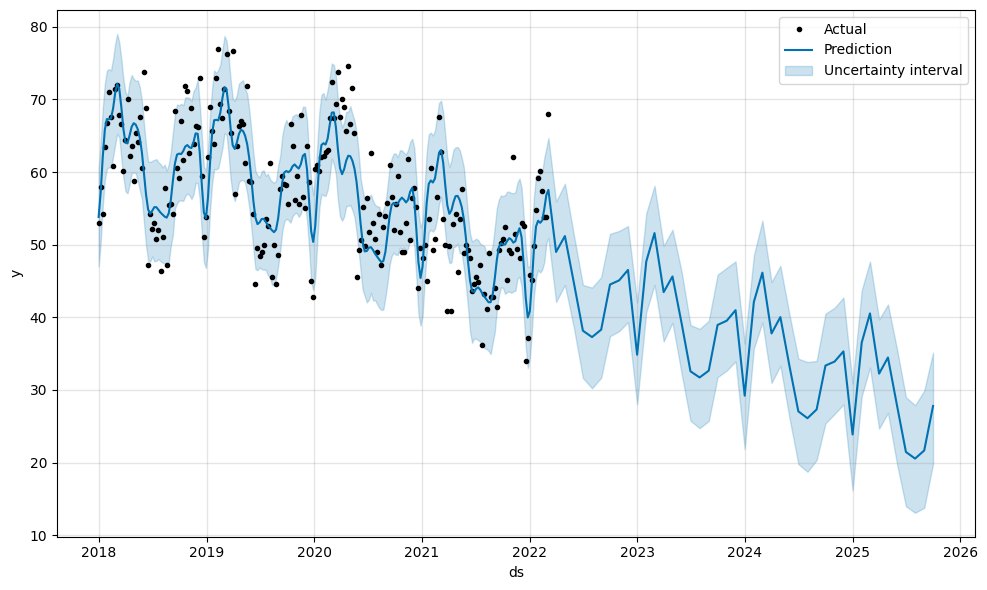

In [72]:
fig = m.plot(forecast)
plt.legend(['Actual', 'Prediction', 'Uncertainty interval'])
plt.show()

In [73]:
from statsmodels.tools.eval_measures import rmse

predictions = forecast.iloc[-len(test):]['yhat']
actuals = test['y']

print(f"RMSE: {round(rmse(predictions, actuals))}")

RMSE: 20


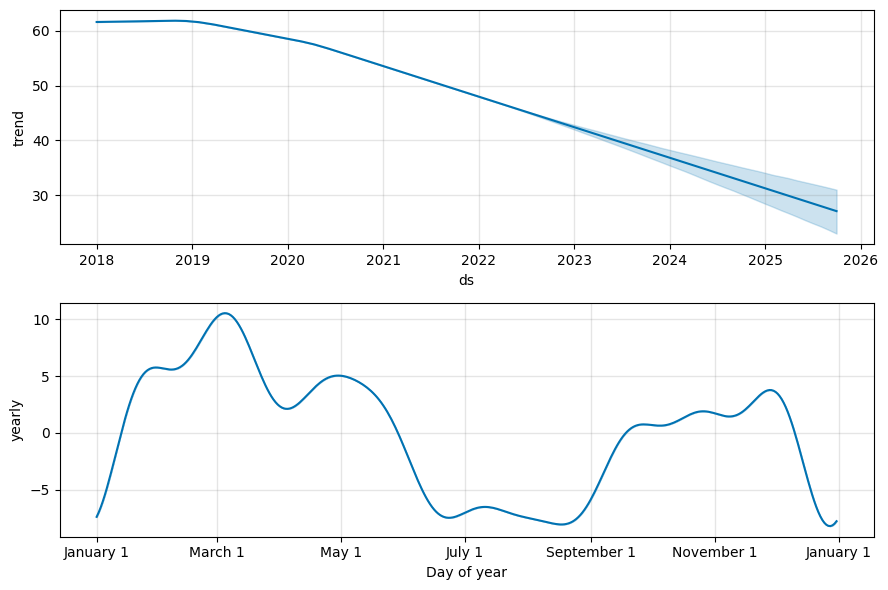

In [74]:
fig = m.plot_components(forecast)

<AxesSubplot: xlabel='ds'>

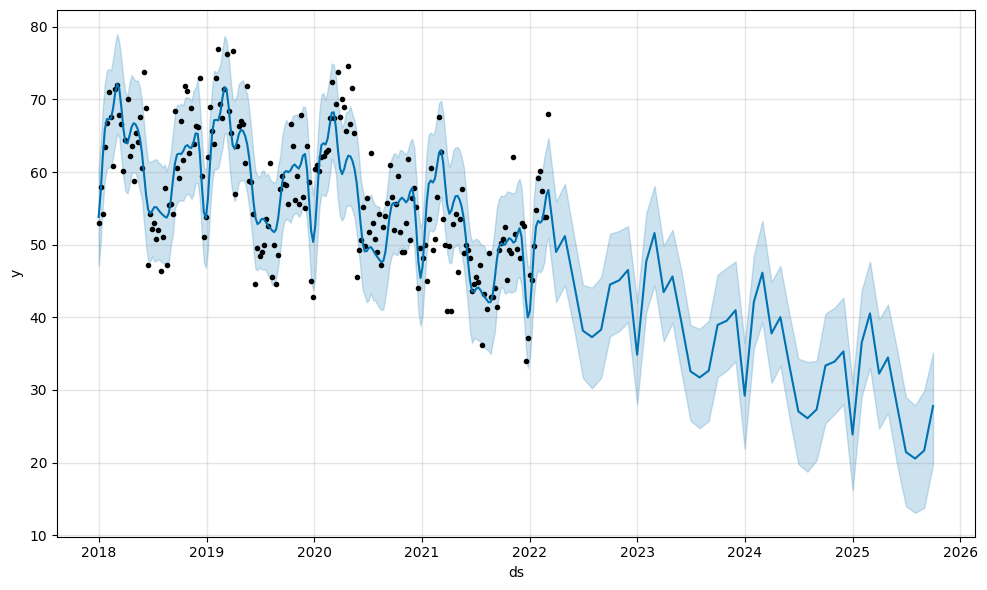

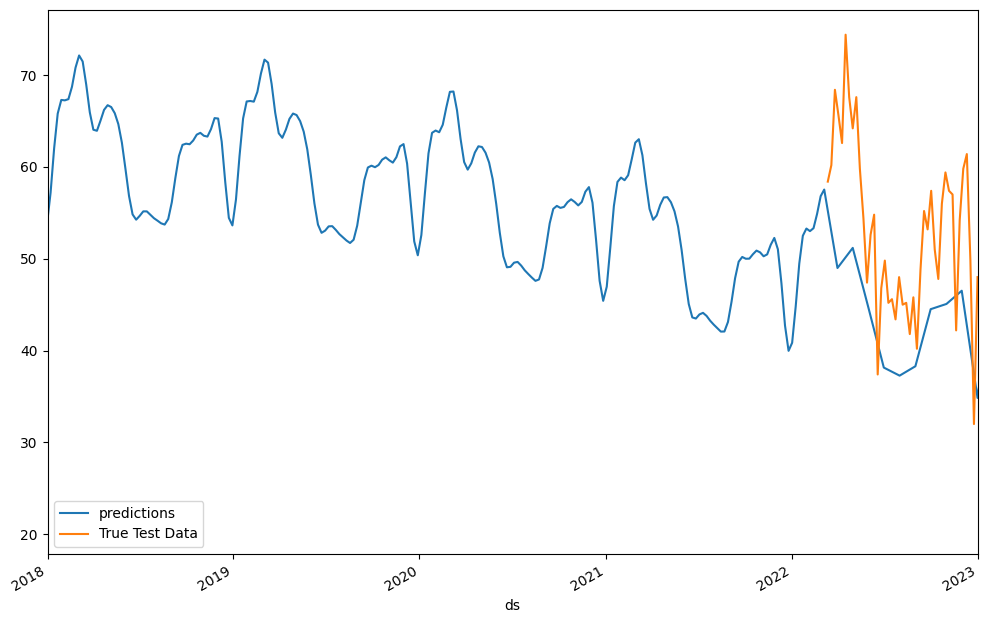

In [76]:
m.plot(forecast)
ax=forecast.plot(x='ds',y='yhat',legend=True,label='predictions',figsize=(12,8))
test.plot(x='ds',y='y',legend=True,label='True Test Data',ax=ax,xlim=('2018-01-01','2023-01-01'))

In [165]:
## Creating DataFrames for exogenous features for each set of lockdowns

### Most
Alaska
California
Hawaii
Mass
Newyork
Washington 

### Least
Arizona
Florida
South Dakota
Texas





In [78]:
# Python
most_lockdowns = pd.DataFrame([
    {'holiday': 'stay_at_home', 'ds': '2020-03-23', 'lower_window': 0, 'ds_upper': '2020-06-07'},
    {'holiday': 'mask_mandate', 'ds': '2020-04-19', 'lower_window': 0, 'ds_upper': '2022-03-13'},
    {'holiday': 'gatherings_banned', 'ds': '2020-03-22', 'lower_window': 0, 'ds_upper': '2021-04-18'},
    {'holiday': 'business_closures', 'ds': '2020-03-22', 'lower_window': 0, 'ds_upper': '2021-05-23'},
    {'holiday': 'travel_restrictions', 'ds': '2020-03-22', 'lower_window': 0, 'ds_upper': '2021-09-05'},
])
for t_col in ['ds', 'ds_upper']:
    most_lockdowns[t_col] = pd.to_datetime(most_lockdowns[t_col])
most_lockdowns['upper_window'] = (most_lockdowns['ds_upper'] - most_lockdowns['ds']).dt.days
most_lockdowns

,holiday,ds,lower_window,ds_upper,upper_window
0,stay_at_home,2020-03-23,0,2020-06-07,76
1,mask_mandate,2020-04-19,0,2022-03-13,693
2,gatherings_banned,2020-03-22,0,2021-04-18,392
3,business_closures,2020-03-22,0,2021-05-23,427
4,travel_restrictions,2020-03-22,0,2021-09-05,532


In [81]:
# Python
least_lockdowns = pd.DataFrame([
    {'holiday': 'stay_at_home', 'ds': '2020-04-05', 'lower_window': 0, 'ds_upper': '2020-05-10'},
    {'holiday': 'gatherings_banned', 'ds': '2020-04-05', 'lower_window': 0, 'ds_upper': '2020-09-20'},
    {'holiday': 'business_closures', 'ds': '2020-04-05', 'lower_window': 0, 'ds_upper': '2021-03-14'},
    {'holiday': 'travel_restrictions', 'ds': '2020-04-12', 'lower_window': 0, 'ds_upper': '2020-05-10'},
])
for t_col in ['ds', 'ds_upper']:
    least_lockdowns[t_col] = pd.to_datetime(least_lockdowns[t_col])
least_lockdowns['upper_window'] = (least_lockdowns['ds_upper'] - least_lockdowns['ds']).dt.days
least_lockdowns

,holiday,ds,lower_window,ds_upper,upper_window
0,stay_at_home,2020-04-05,0,2020-05-10,35
1,gatherings_banned,2020-04-05,0,2020-09-20,168
2,business_closures,2020-04-05,0,2021-03-14,343
3,travel_restrictions,2020-04-12,0,2020-05-10,28


In [ ]:
most_depression

In [83]:
# Python
m2 = Prophet(holidays=most_lockdowns)
m2 = m2.fit(most_depression)
future2 = m2.make_future_dataframe(periods=366)
forecast2 = m2.predict(future2)

20:48:45 - cmdstanpy - INFO - Chain [1] start processing
20:48:46 - cmdstanpy - INFO - Chain [1] done processing


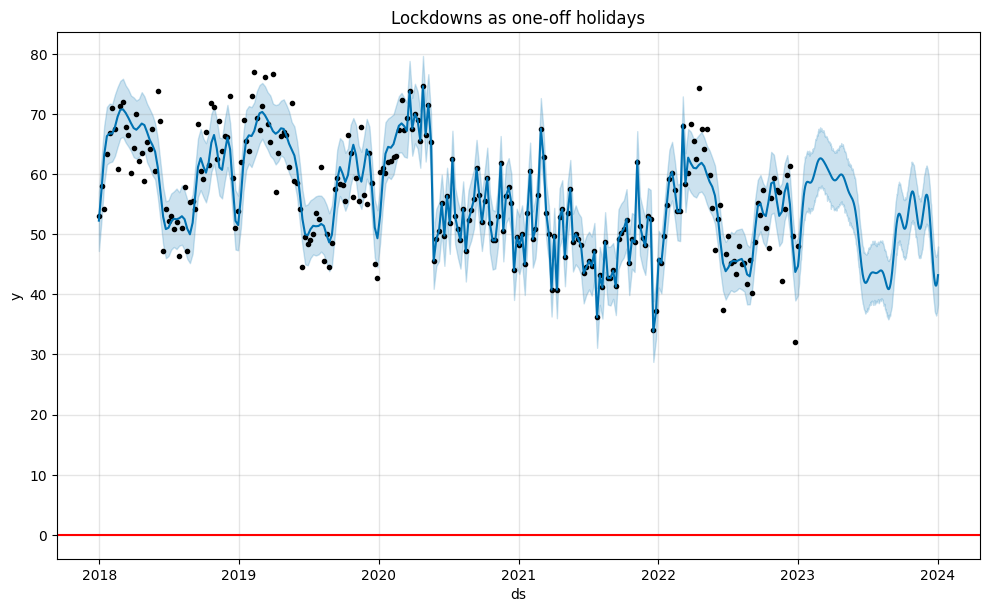

In [84]:
# Python
m2.plot(forecast2)
plt.axhline(y=0, color='red')
plt.title('Lockdowns as one-off holidays');


In [85]:
train = most_depression[most_depression['ds'] < pd.Timestamp('2020-05-31')]
test = most_depression[most_depression['ds'] >= pd.Timestamp('2020-05-31')]

In [86]:
print(f"Number of months in train data: {len(train)}")
print(f"Number of months in test data: {len(test)}")

Number of months in train data: 126
Number of months in test data: 136


In [87]:
# fit model - ignore train/test split for now 
m = Prophet(holidays=most_lockdowns)
m.fit(train)

20:53:45 - cmdstanpy - INFO - Chain [1] start processing
20:53:45 - cmdstanpy - INFO - Chain [1] done processing


In [93]:
# future dataframe - placeholder object
future = m.make_future_dataframe(periods=12, freq='MS') 

In [94]:
future.head()

,ds
0,2017-12-31
1,2018-01-07
2,2018-01-14
3,2018-01-21
4,2018-01-28


In [95]:
forecast = m.predict(future)

<AxesSubplot: xlabel='ds'>

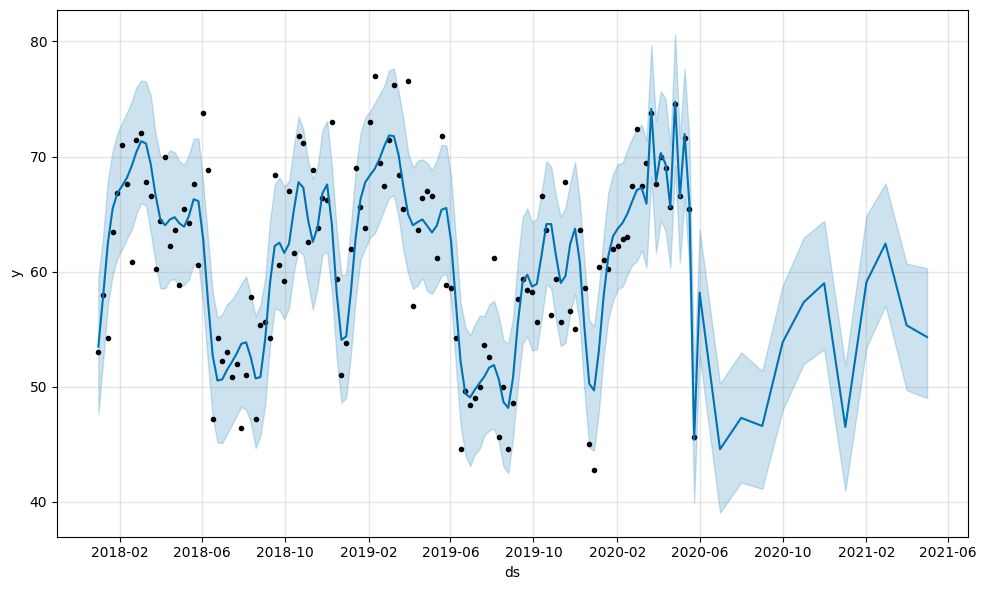

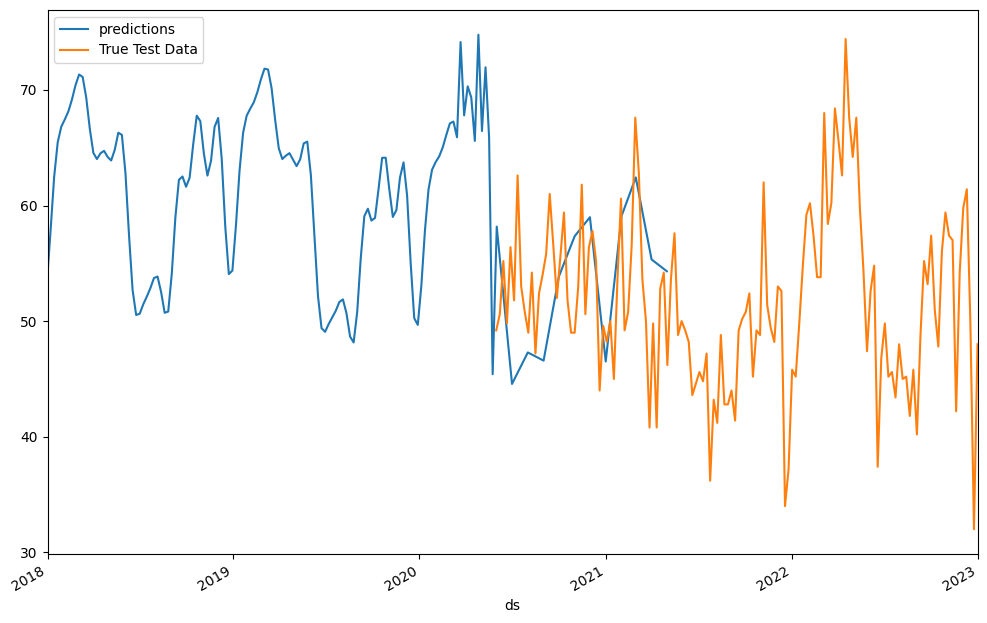

In [96]:
m.plot(forecast)
ax=forecast.plot(x='ds',y='yhat',legend=True,label='predictions',figsize=(12,8))
test.plot(x='ds',y='y',legend=True,label='True Test Data',ax=ax,xlim=('2018-01-01','2023-01-01'))

In [97]:

predictions = forecast.iloc[-len(test):]['yhat']
actuals = test['y']

print(f"RMSE: {round(rmse(predictions, actuals))}")

RMSE: 14


In [101]:
from prophet import Prophet
from prophet.diagnostics import cross_validation
from prophet.diagnostics import performance_metrics
from prophet.plot import plot_cross_validation_metric

### Most restricted states with exogenous features

In [ ]:
most_depression

<AxesSubplot: xlabel='ds'>

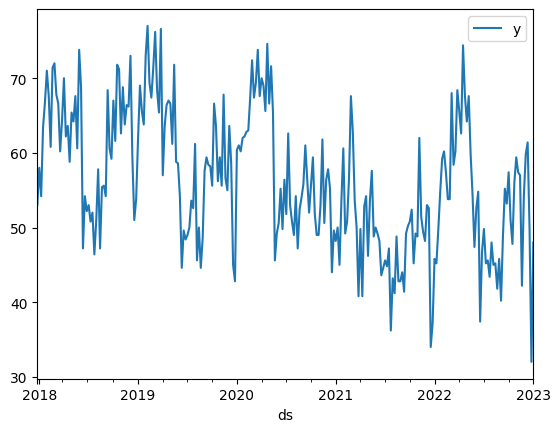

In [102]:
most_depression['ds']=pd.to_datetime(most_depression.ds)
most_depression.plot(x='ds',y='y')


In [103]:
len(most_depression)
#144

262

In [104]:


train=most_depression[:128]
test=most_depression[128:]

In [105]:
m=Prophet(holidays=most_lockdowns,seasonality_mode='multiplicative')
m.fit(train)
future=m.make_future_dataframe(periods=12,freq='MS')
forecast=m.predict(future)
forecast.head()

21:46:46 - cmdstanpy - INFO - Chain [1] start processing
21:46:46 - cmdstanpy - INFO - Chain [1] done processing


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,business_closures,business_closures_lower,business_closures_upper,gatherings_banned,...,travel_restrictions,travel_restrictions_lower,travel_restrictions_upper,yearly,yearly_lower,yearly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat
0,2017-12-31,60.296467,47.443909,58.091859,60.296467,60.296467,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,-0.120368,-0.120368,-0.120368,0.0,0.0,0.0,53.038712
1,2018-01-07,60.340686,51.980448,62.656457,60.340686,60.340686,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,-0.047766,-0.047766,-0.047766,0.0,0.0,0.0,57.458427
2,2018-01-14,60.384904,57.078704,67.423427,60.384904,60.384904,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.029221,0.029221,0.029221,0.0,0.0,0.0,62.149382
3,2018-01-21,60.429123,59.788218,70.773547,60.429123,60.429123,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.078789,0.078789,0.078789,0.0,0.0,0.0,65.190263
4,2018-01-28,60.473341,61.146836,72.220519,60.473341,60.473341,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.100831,0.100831,0.100831,0.0,0.0,0.0,66.570902


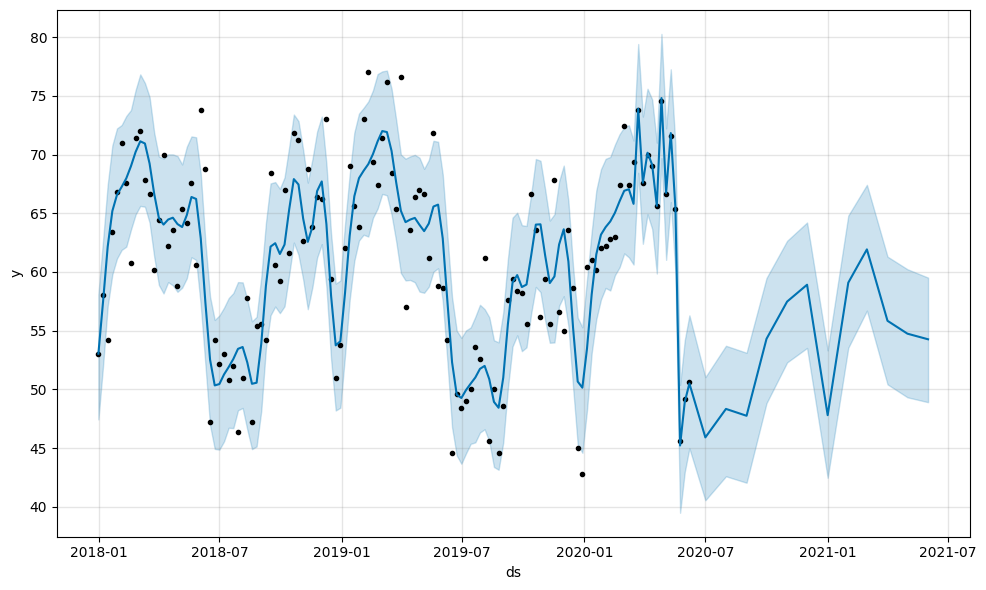

In [106]:
m.plot(forecast, uncertainty=True)
plt.show()

<AxesSubplot: xlabel='ds'>

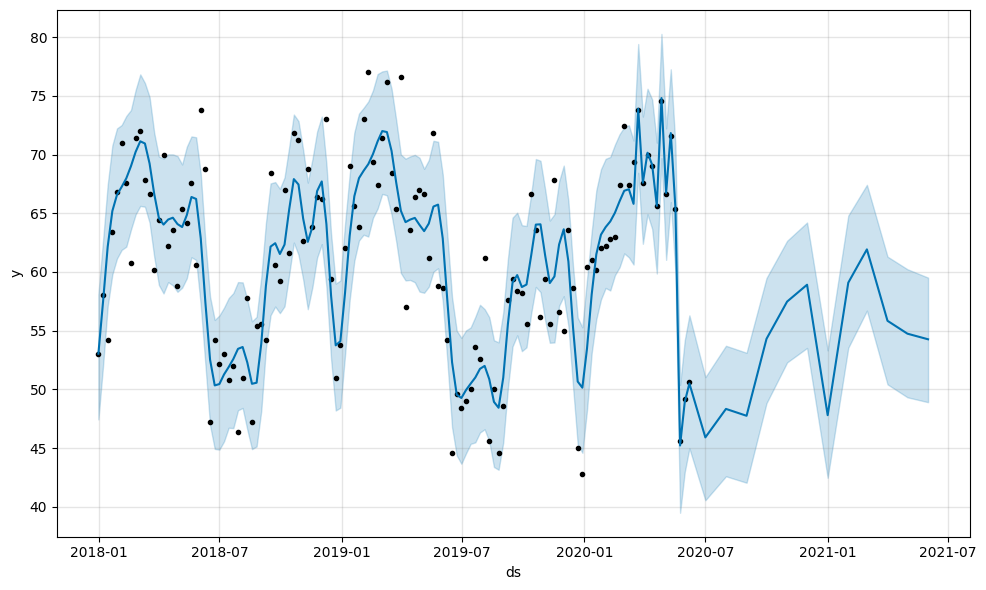

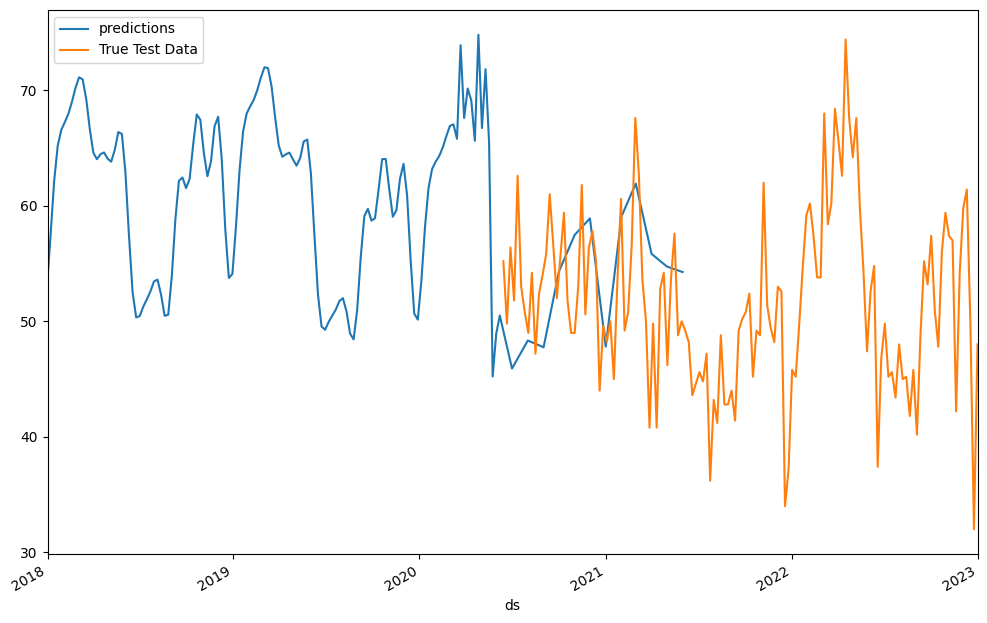

In [107]:
m.plot(forecast)
ax=forecast.plot(x='ds',y='yhat',legend=True,label='predictions',figsize=(12,8))
test.plot(x='ds',y='y',legend=True,label='True Test Data',ax=ax,xlim=('2018-01-01','2023-01-01'))

09:01:47 - cmdstanpy - INFO - Chain [1] start processing
09:01:47 - cmdstanpy - INFO - Chain [1] done processing


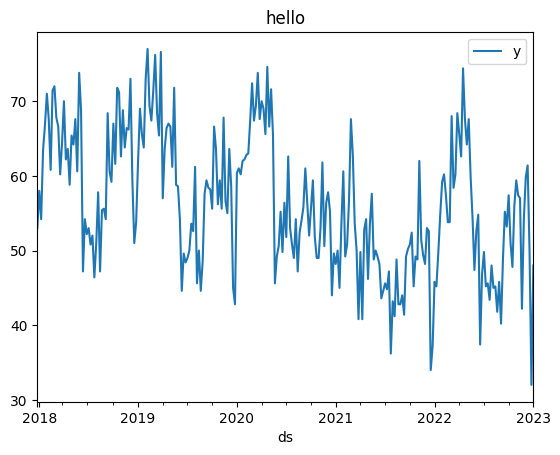

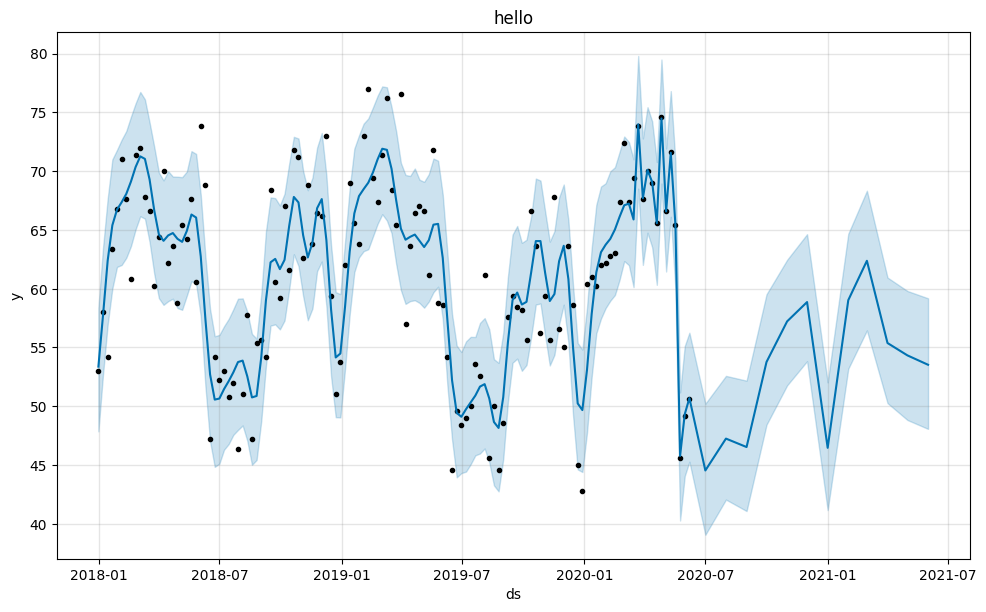

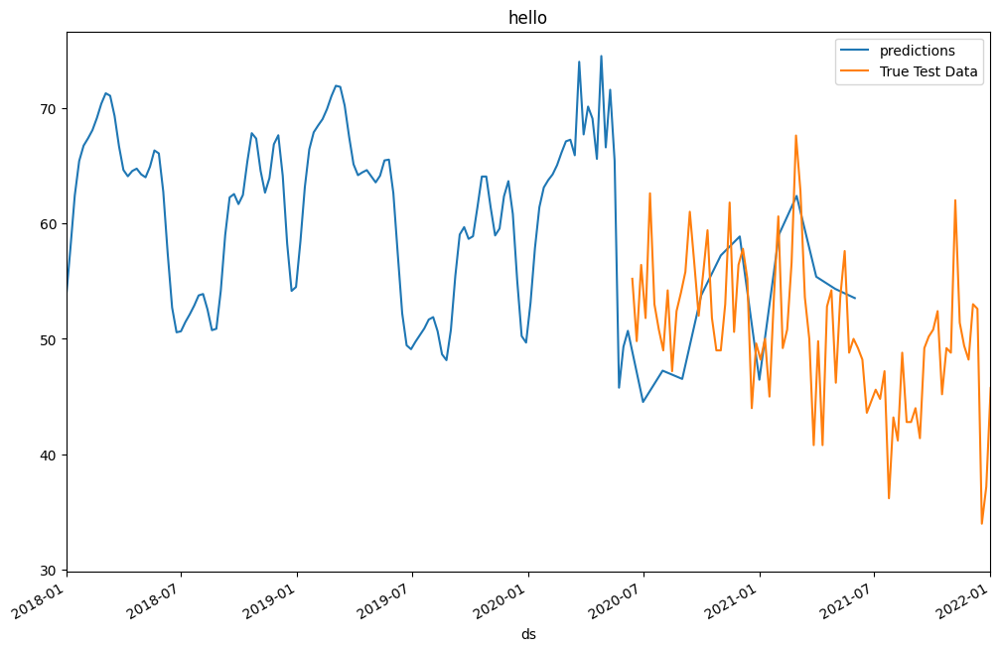

RMSE: 14


09:01:49 - cmdstanpy - INFO - Chain [1] start processing
09:01:50 - cmdstanpy - INFO - Chain [1] done processing


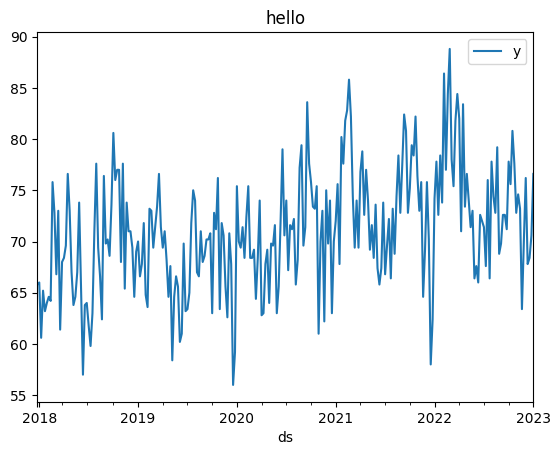

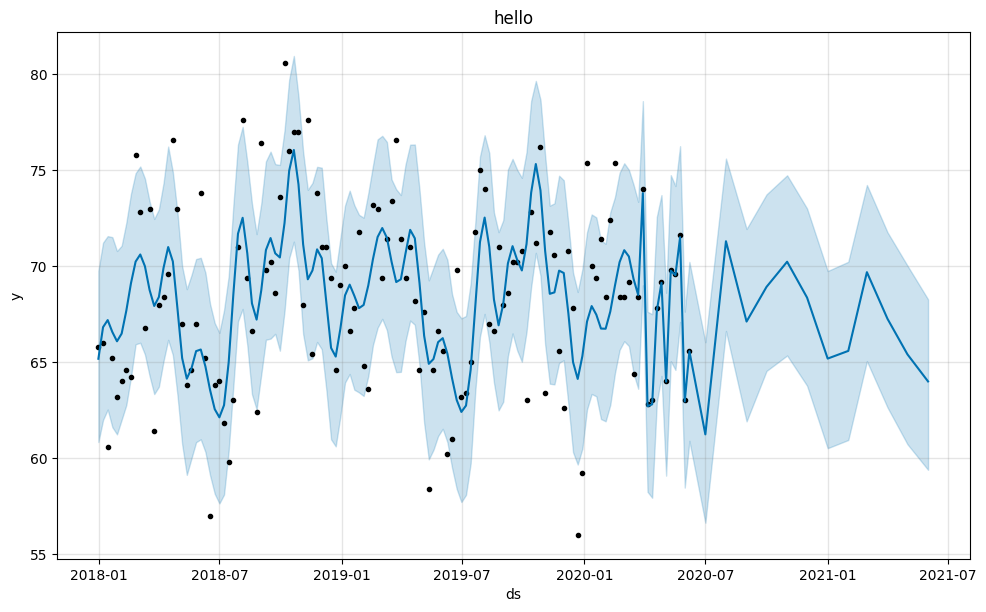

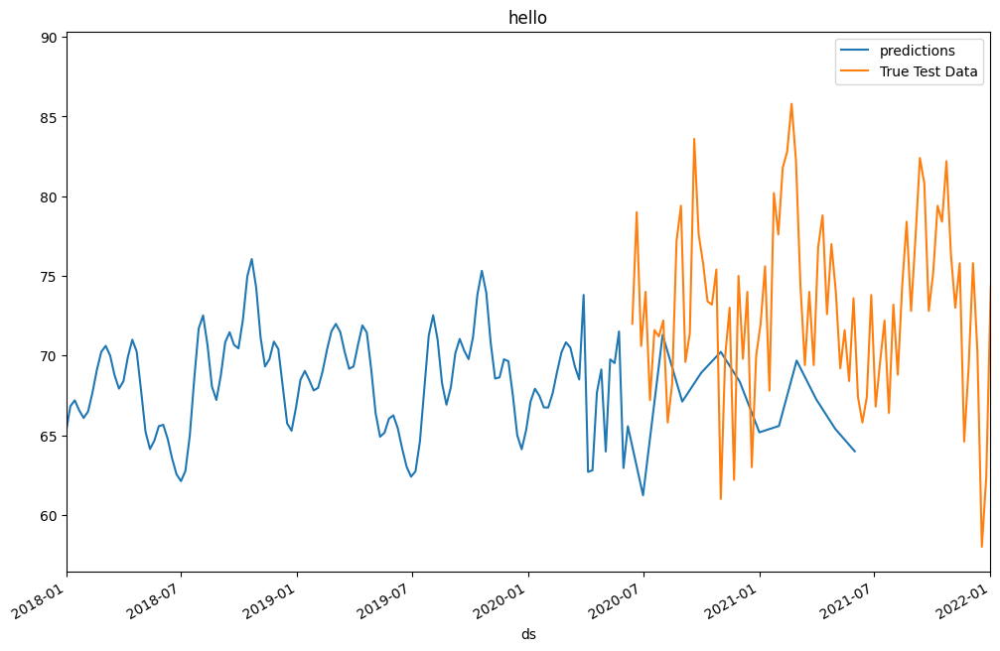

RMSE: 8


09:01:52 - cmdstanpy - INFO - Chain [1] start processing
09:01:53 - cmdstanpy - INFO - Chain [1] done processing


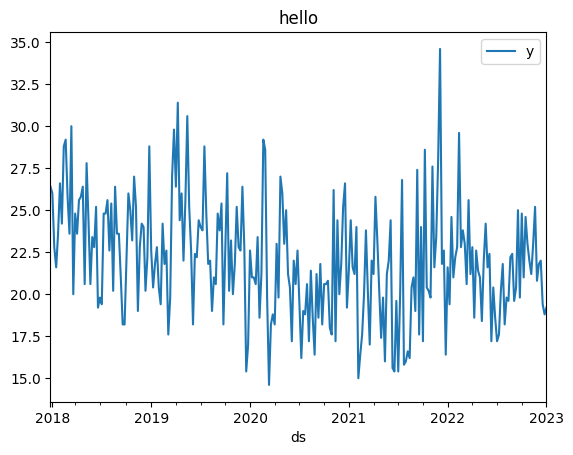

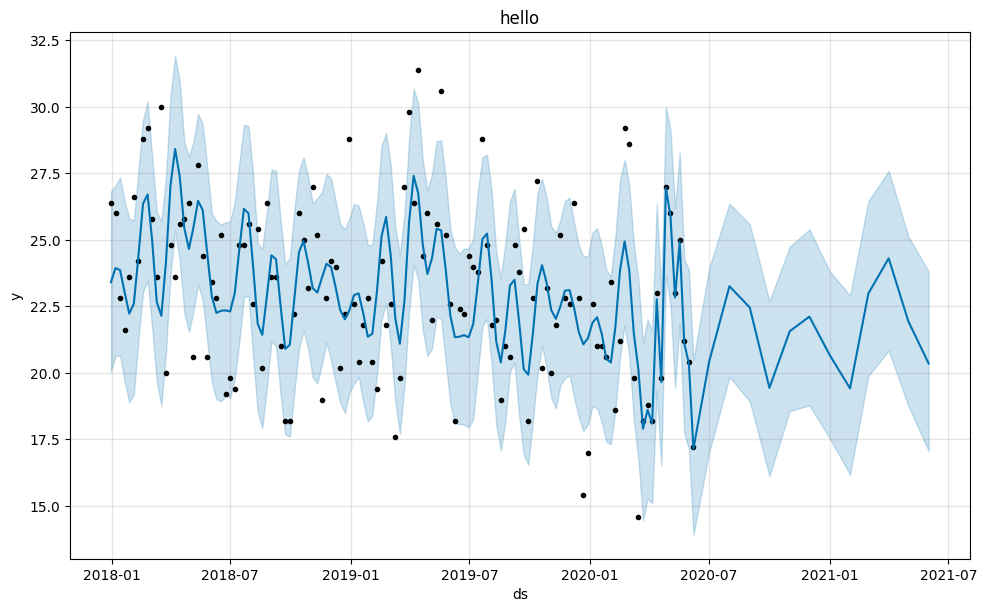

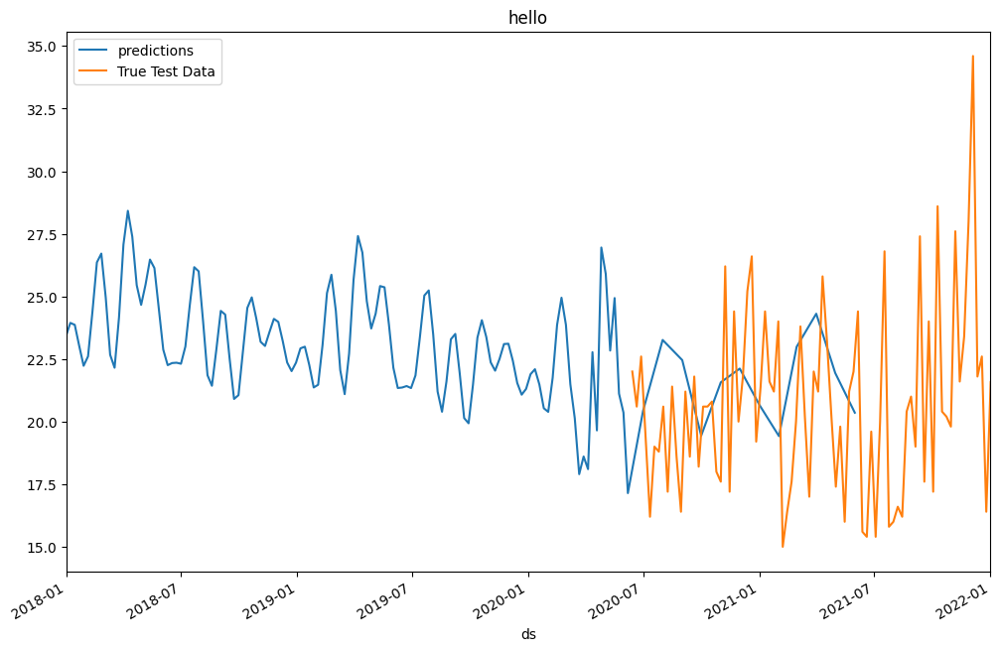

RMSE: 5


09:01:55 - cmdstanpy - INFO - Chain [1] start processing
09:01:55 - cmdstanpy - INFO - Chain [1] done processing


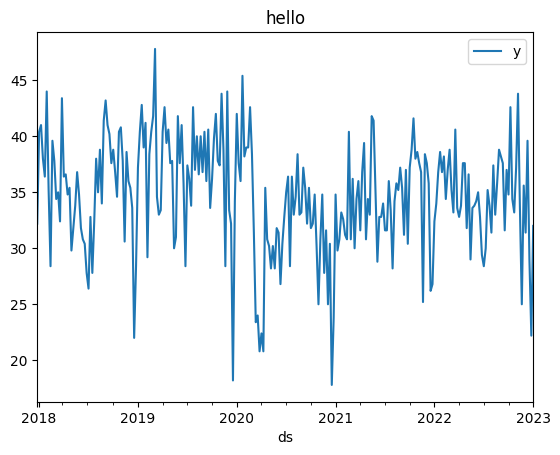

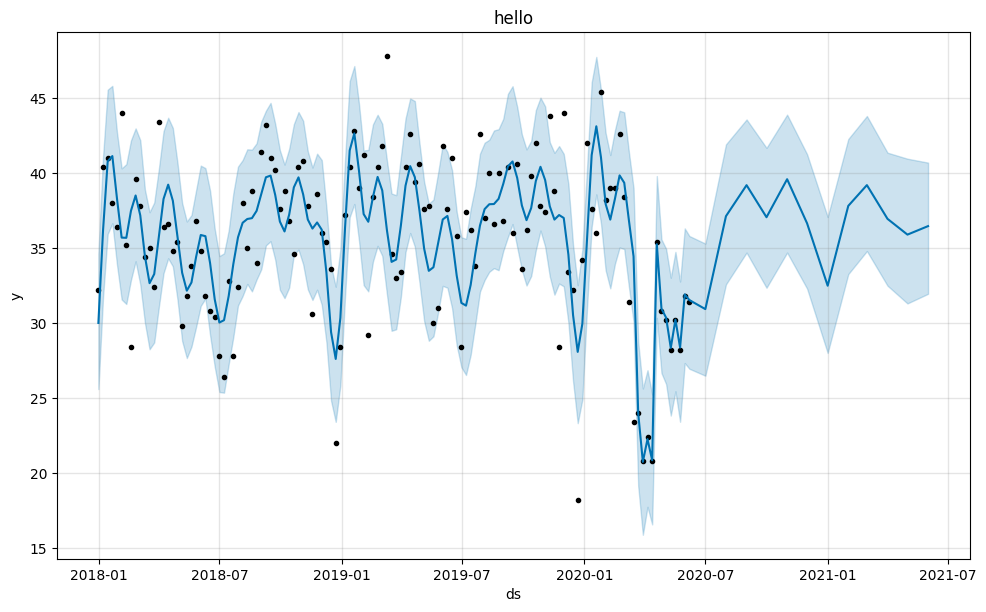

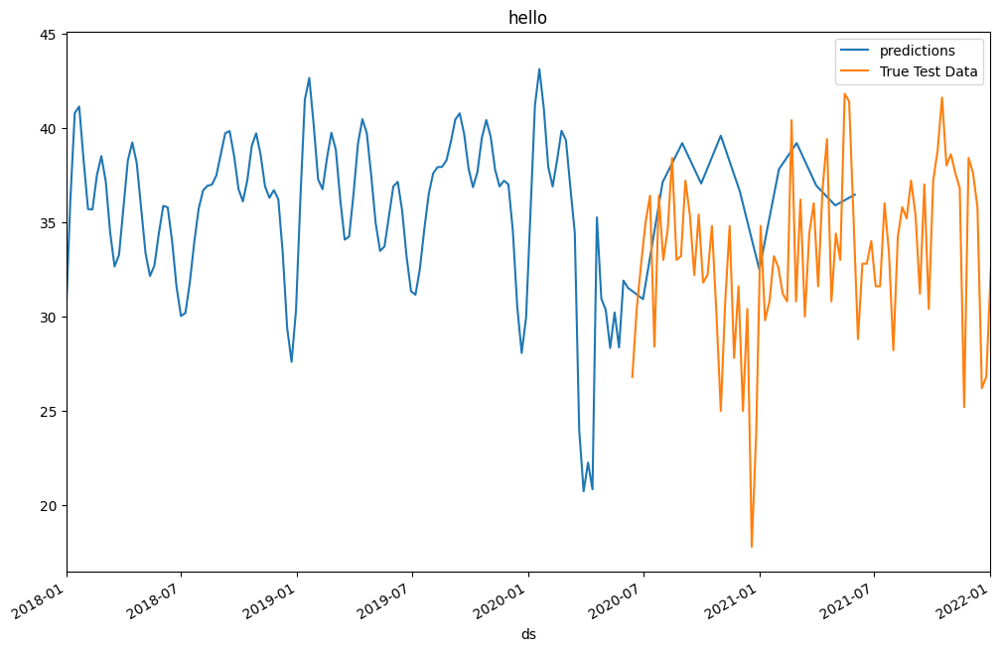

RMSE: 6


09:01:57 - cmdstanpy - INFO - Chain [1] start processing
09:01:58 - cmdstanpy - INFO - Chain [1] done processing


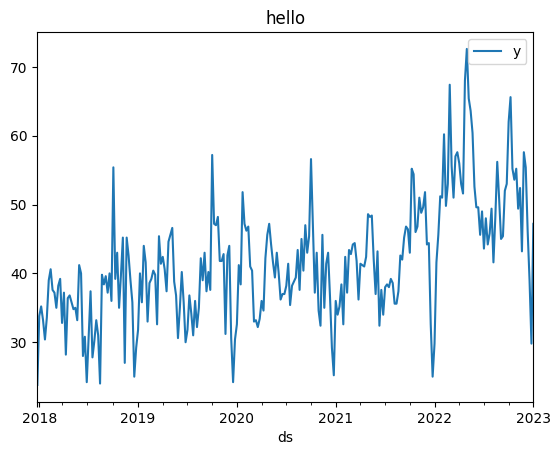

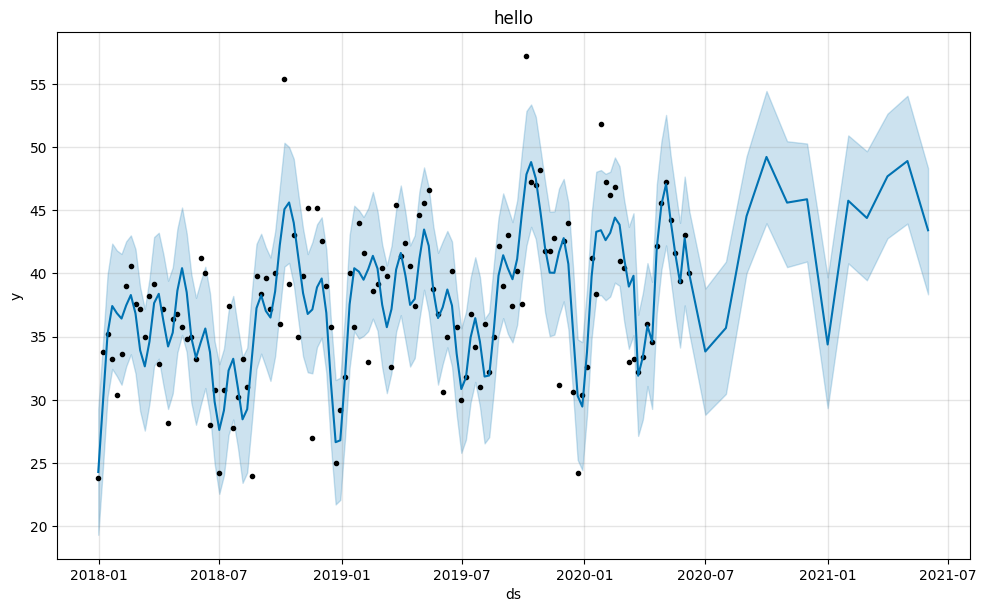

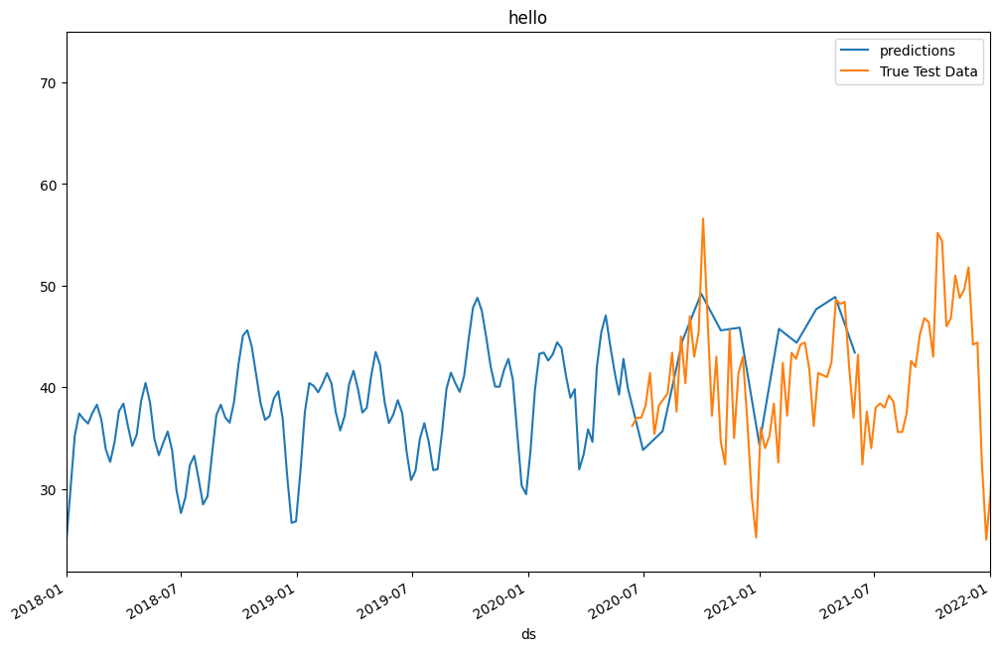

RMSE: 12


In [175]:
most_list= [most_depression,most_anxiety,most_addiction,most_counselling,most_mental_health]


for item in most_list:
    
    item['ds']=pd.to_datetime(item.ds)
    
    item.plot(x='ds',y='y')
    plt.title("hello")
    train=item[:128]
    test=item[128:]
    m=Prophet(holidays=most_lockdowns)
    m.fit(train)
    future=m.make_future_dataframe(periods=12,freq='MS')
    forecast=m.predict(future)
    m.plot(forecast)
    plt.title("hello")
    ax=forecast.plot(x='ds',y='yhat',legend=True,label='predictions',figsize=(12,8))
    test.plot(x='ds',y='y',legend=True,label='True Test Data',ax=ax,xlim=('2018-01-01','2022-01-01'))
    predictions = forecast.iloc[-len(test):]['yhat']
    actuals = test['y']
    plt.title("hello")
    plt.show()
    

    print(f"RMSE: {round(rmse(predictions, actuals))}")


### Without exogenous features

09:24:28 - cmdstanpy - INFO - Chain [1] start processing
09:24:28 - cmdstanpy - INFO - Chain [1] done processing


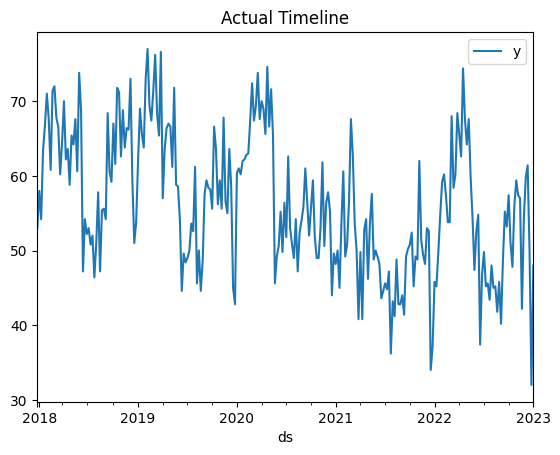

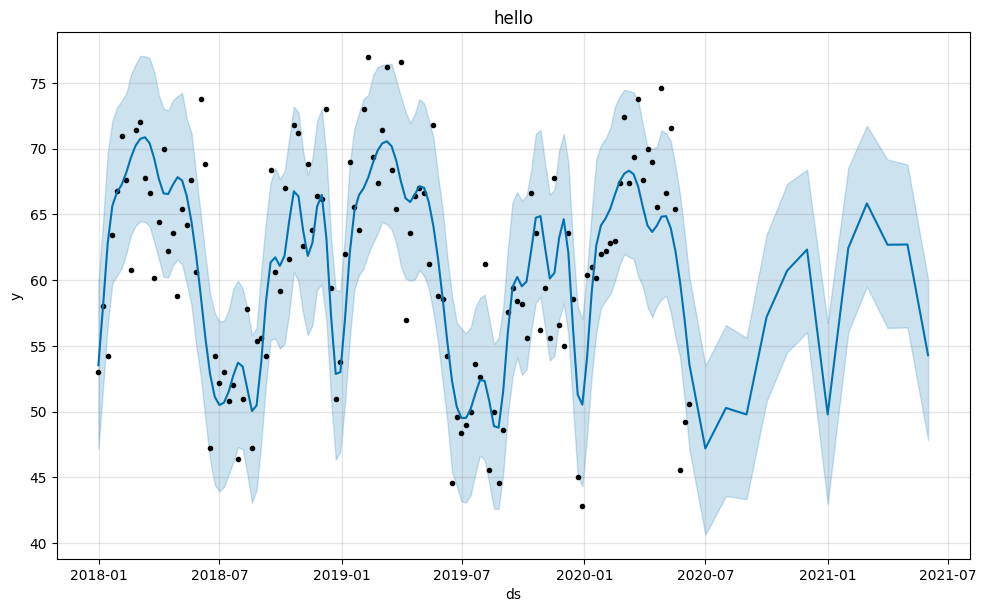

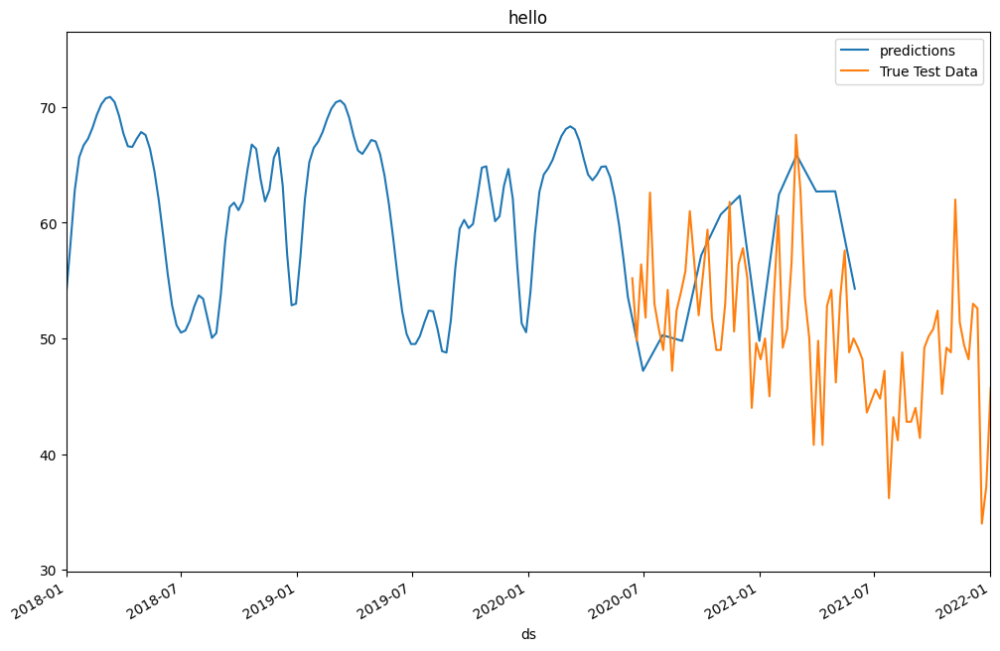

09:24:29 - cmdstanpy - INFO - Chain [1] start processing
09:24:29 - cmdstanpy - INFO - Chain [1] done processing


RMSE: 14


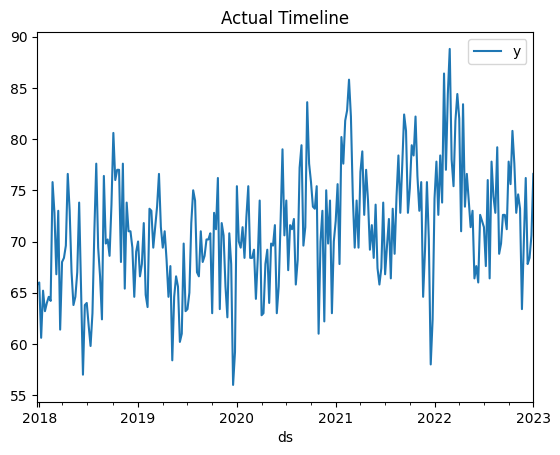

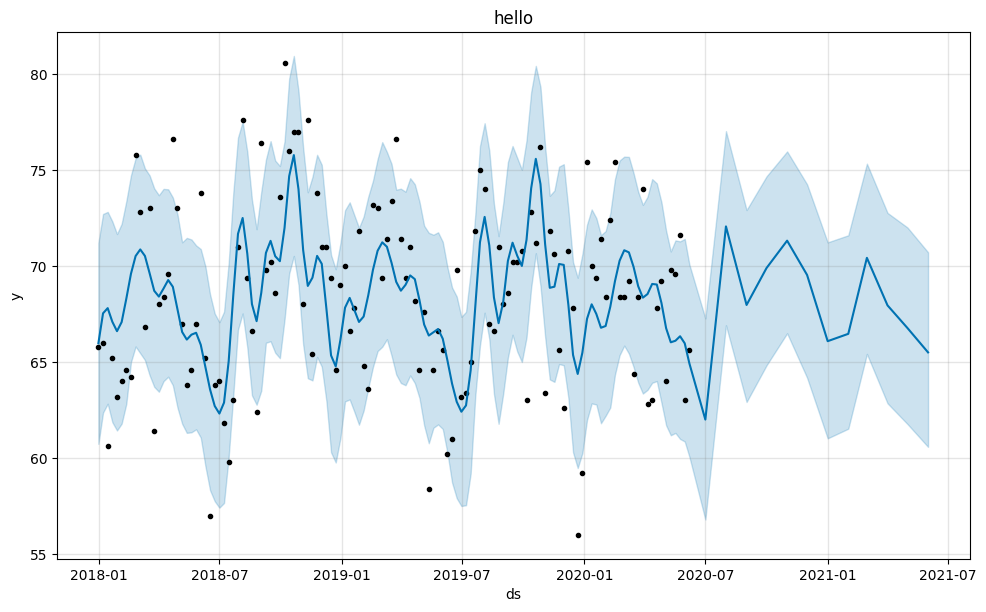

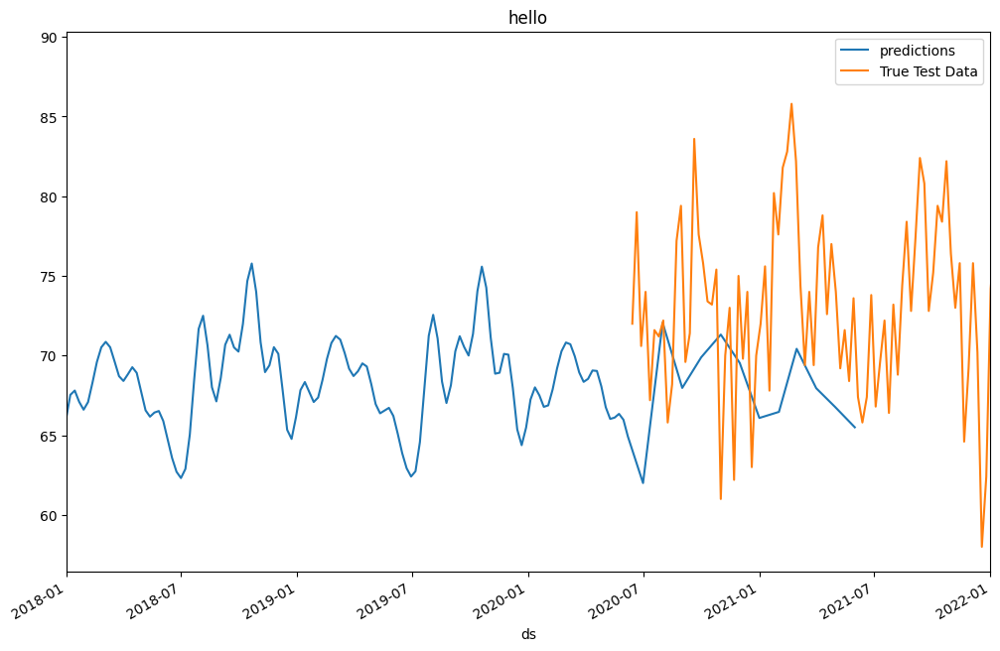

09:24:30 - cmdstanpy - INFO - Chain [1] start processing
09:24:30 - cmdstanpy - INFO - Chain [1] done processing


RMSE: 8


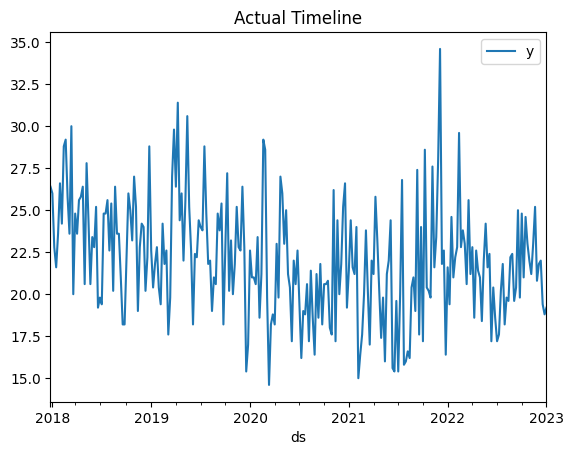

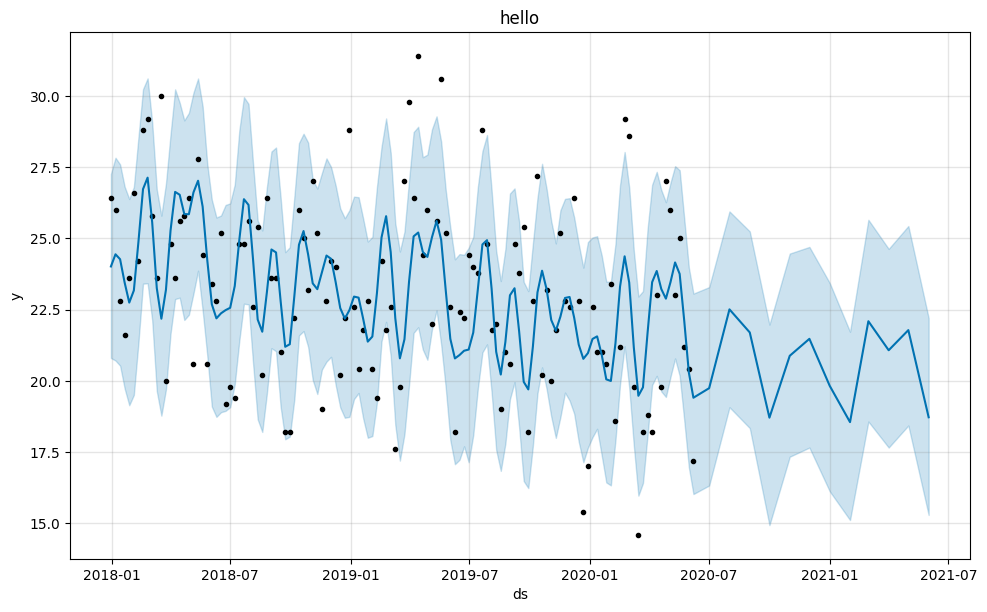

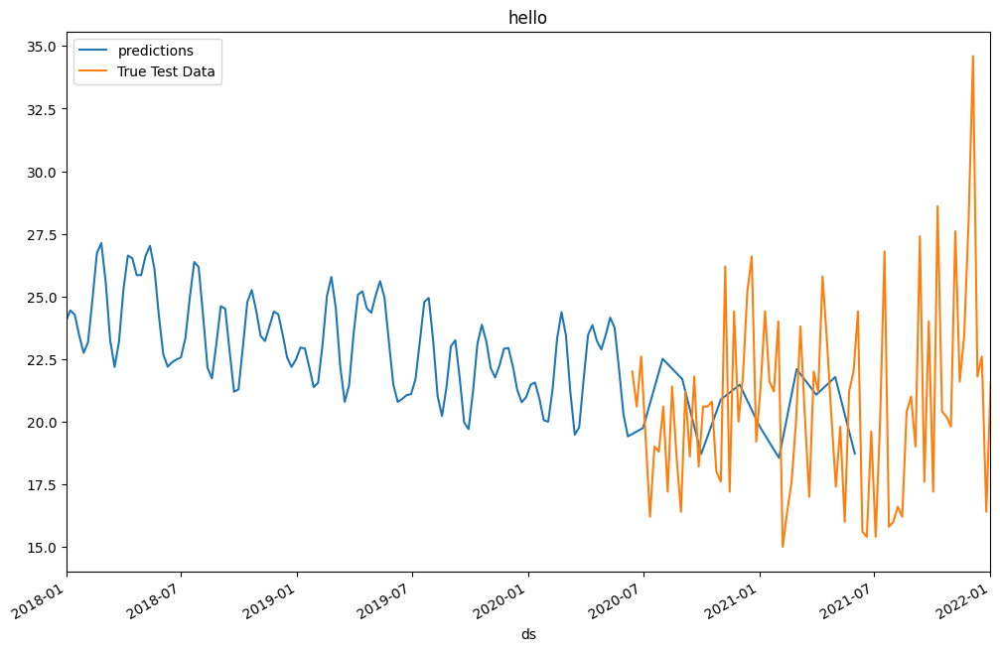

09:24:31 - cmdstanpy - INFO - Chain [1] start processing
09:24:31 - cmdstanpy - INFO - Chain [1] done processing


RMSE: 4


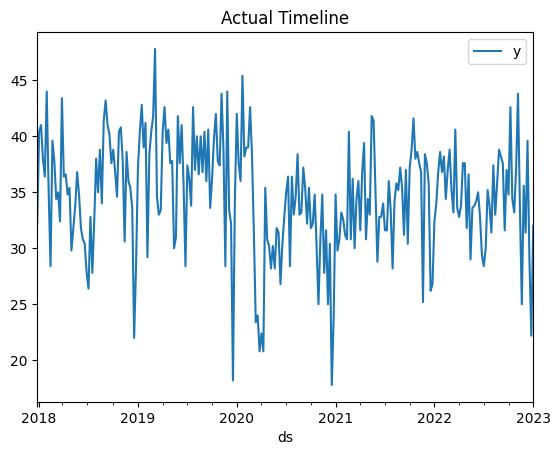

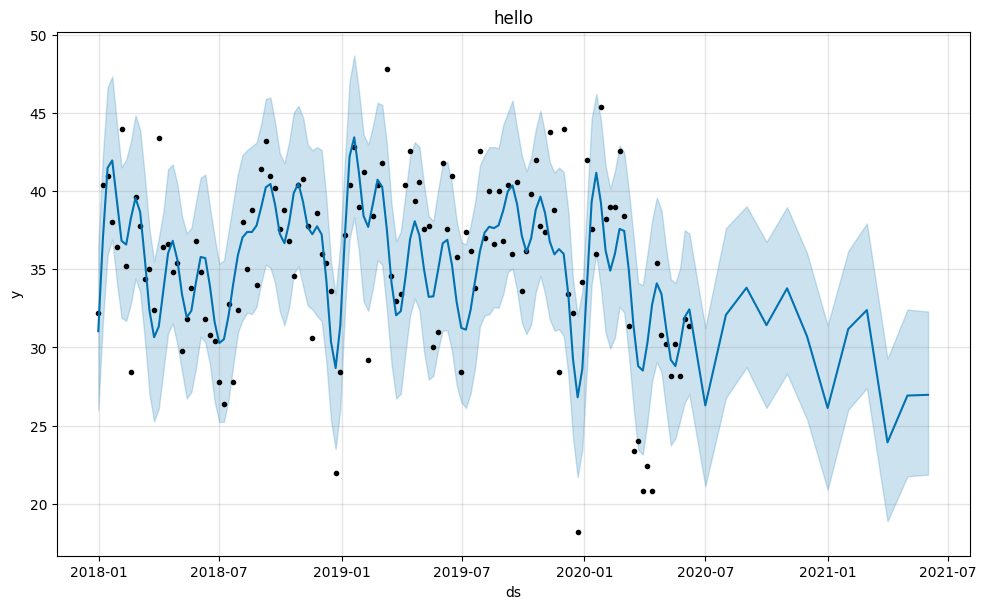

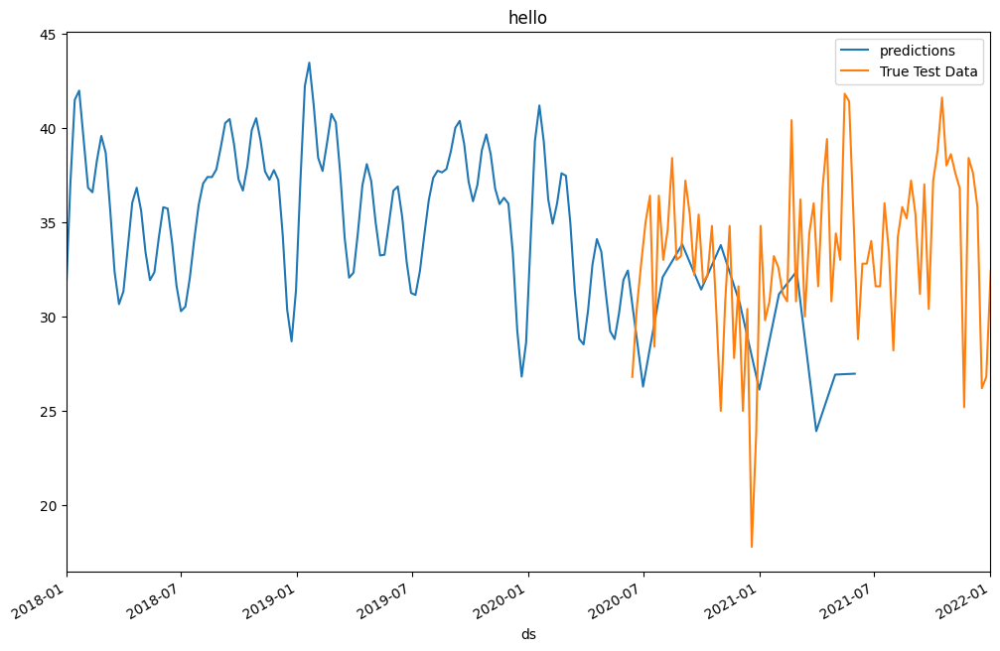

09:24:32 - cmdstanpy - INFO - Chain [1] start processing
09:24:32 - cmdstanpy - INFO - Chain [1] done processing


RMSE: 6


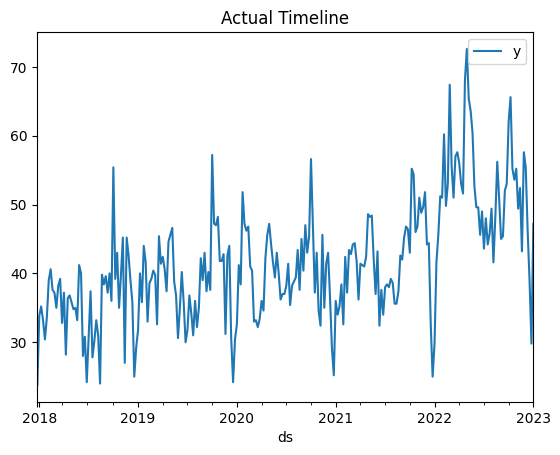

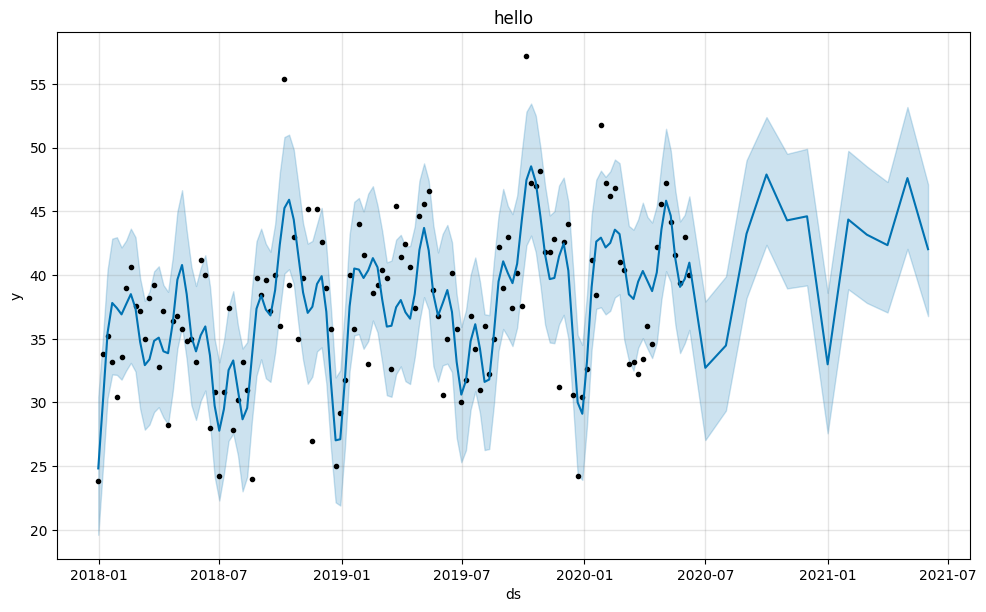

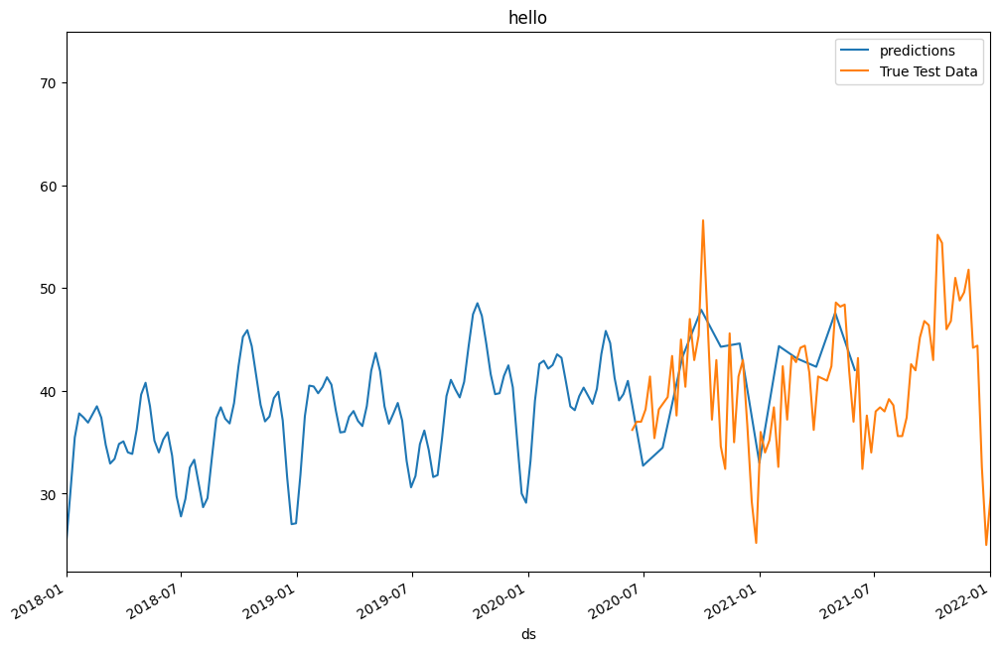

RMSE: 12


In [181]:
most_list= [most_depression,most_anxiety,most_addiction,most_counselling,most_mental_health]
search_list = ['Depression', 'Anxiety', 'Addiction', 'Counselling',
       'Mental_Health']

for item in most_list:

    item['ds']=pd.to_datetime(item.ds)

    item.plot(x='ds',y='y')
    plt.title(f"Actual Timeline")
    train=item[:128]
    test=item[128:]
    m=Prophet()
    m.fit(train)
    future=m.make_future_dataframe(periods=12,freq='MS')
    forecast=m.predict(future)
    m.plot(forecast)
    plt.title("hello")
    ax=forecast.plot(x='ds',y='yhat',legend=True,label='predictions',figsize=(12,8))
    test.plot(x='ds',y='y',legend=True,label='True Test Data',ax=ax,xlim=('2018-01-01','2022-01-01'))
    predictions = forecast.iloc[-len(test):]['yhat']
    actuals = test['y']
    plt.title("hello")
    plt.show()


    print(f"RMSE: {round(rmse(predictions, actuals))}")

### Least Restricitons with exogenous features 

09:28:17 - cmdstanpy - INFO - Chain [1] start processing
09:28:17 - cmdstanpy - INFO - Chain [1] done processing


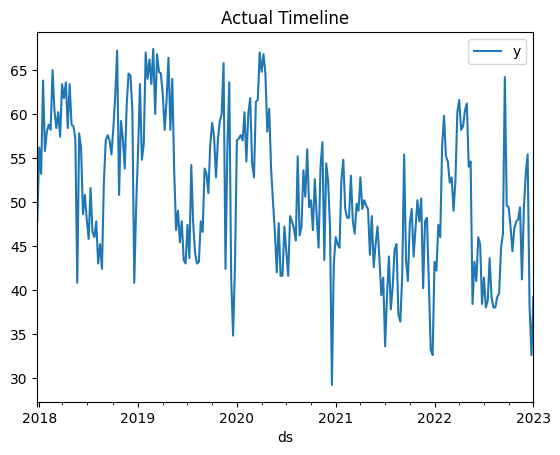

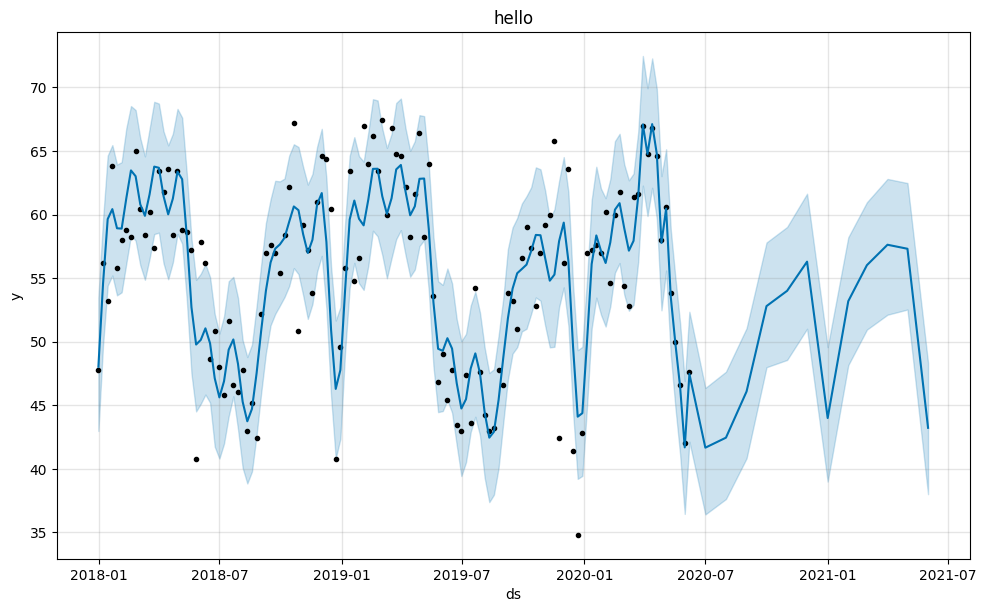

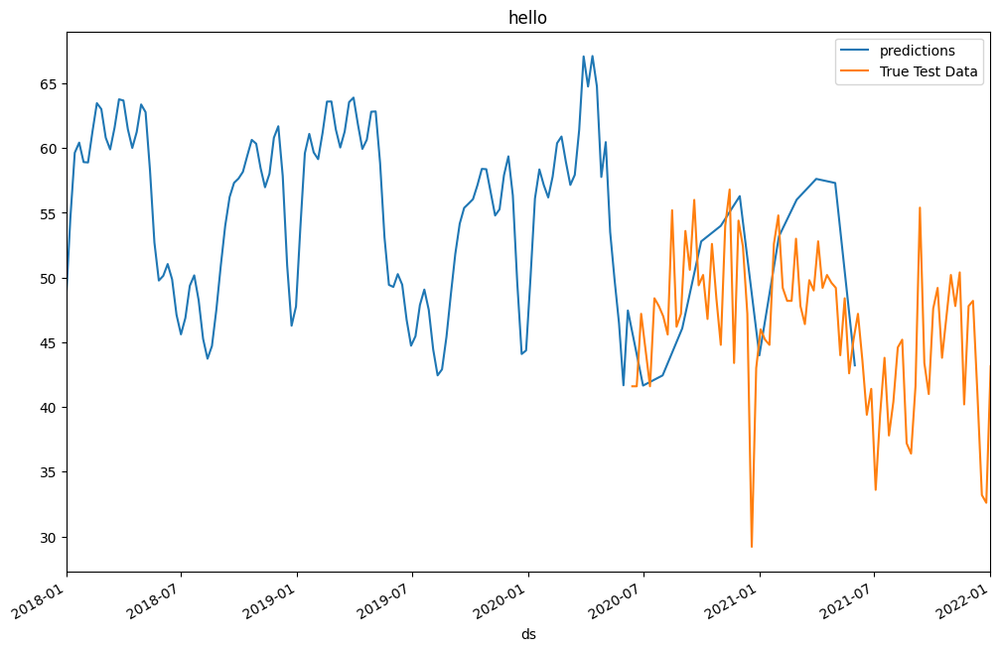

RMSE: 13


09:28:20 - cmdstanpy - INFO - Chain [1] start processing
09:28:20 - cmdstanpy - INFO - Chain [1] done processing


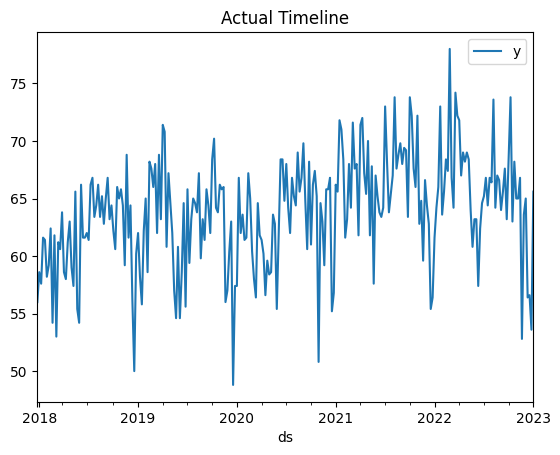

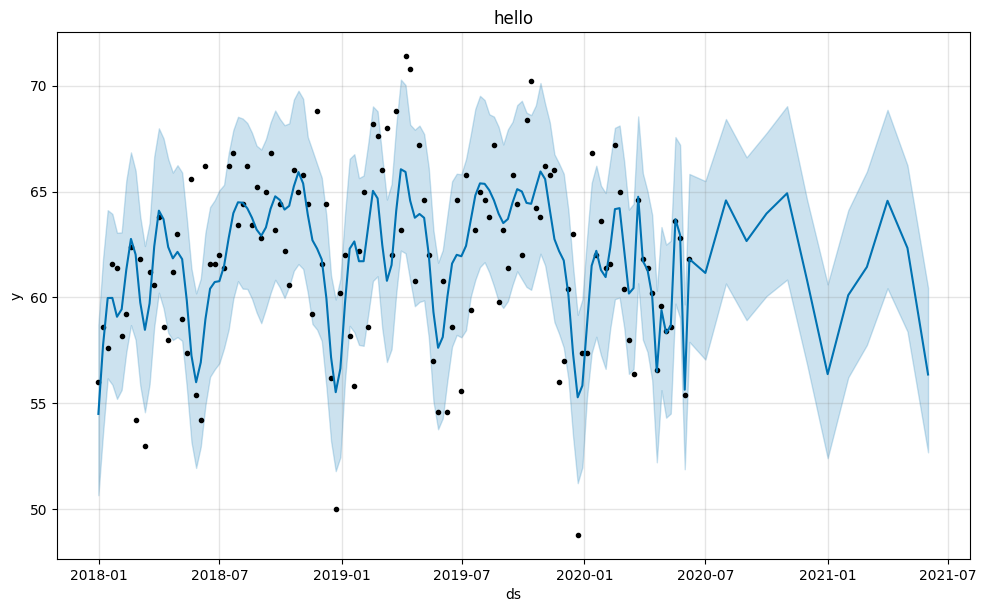

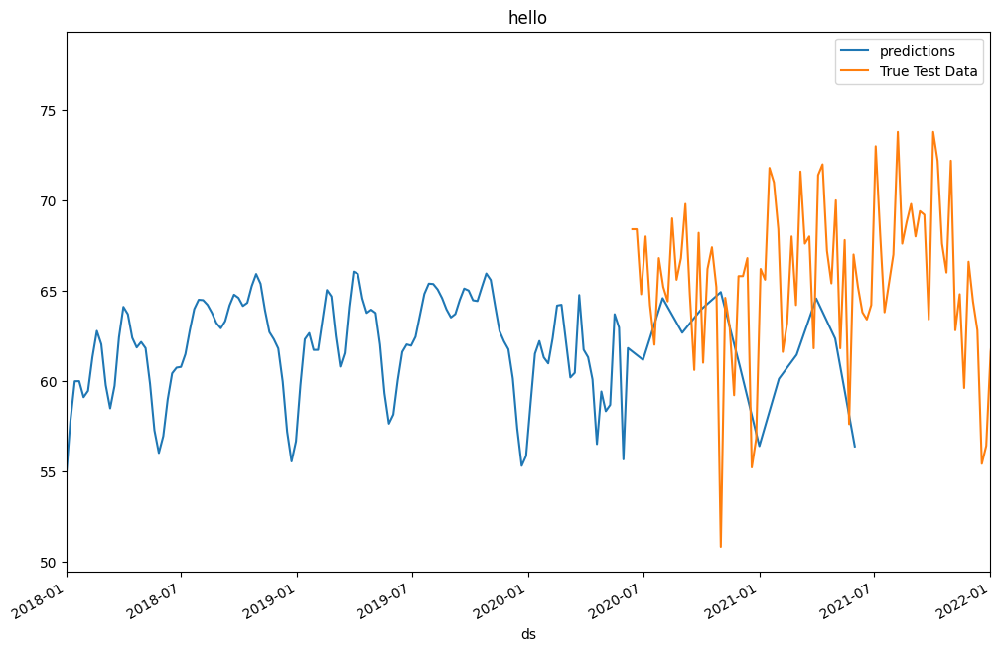

RMSE: 6


09:28:22 - cmdstanpy - INFO - Chain [1] start processing
09:28:23 - cmdstanpy - INFO - Chain [1] done processing


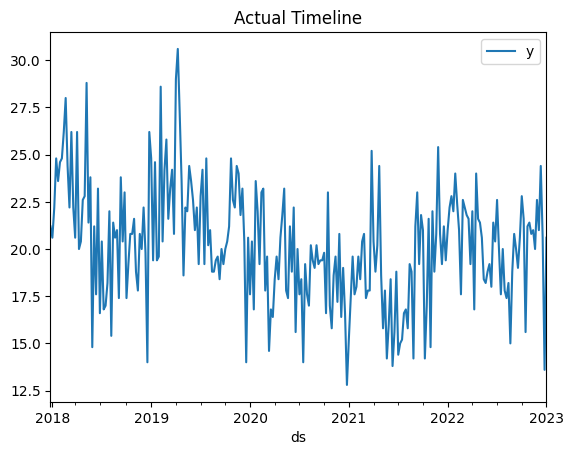

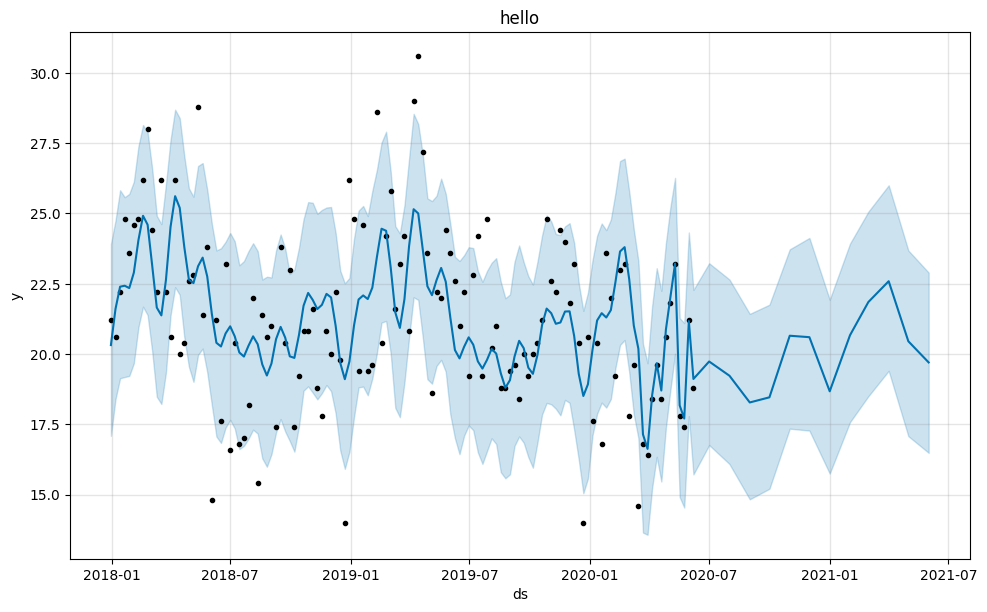

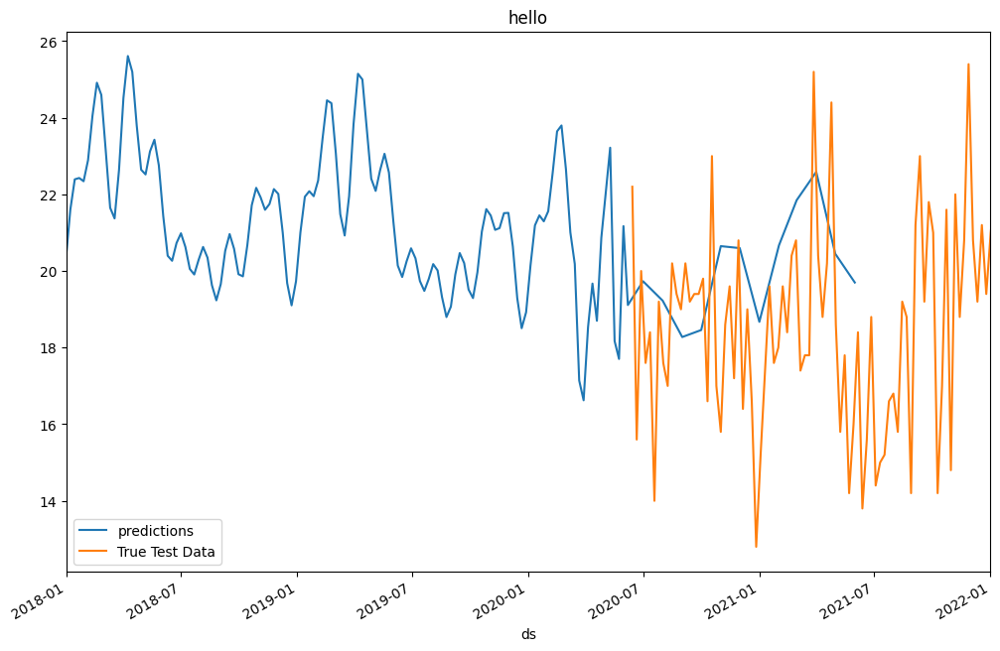

RMSE: 4


09:28:25 - cmdstanpy - INFO - Chain [1] start processing
09:28:25 - cmdstanpy - INFO - Chain [1] done processing


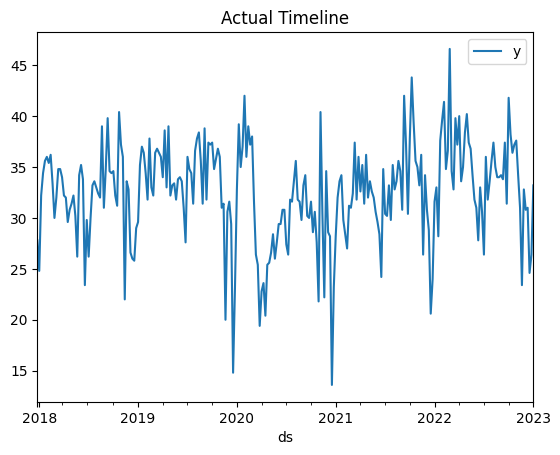

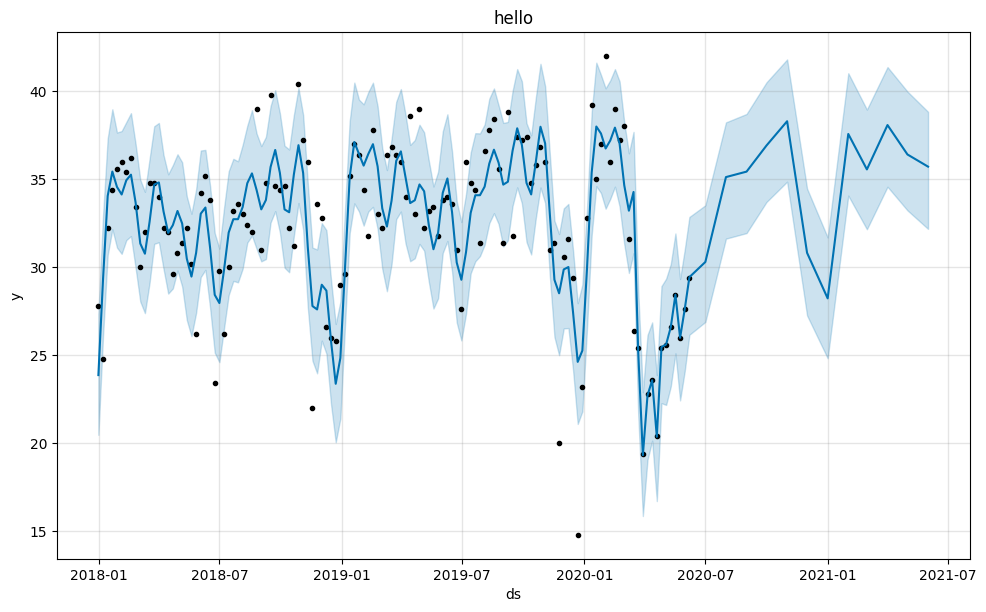

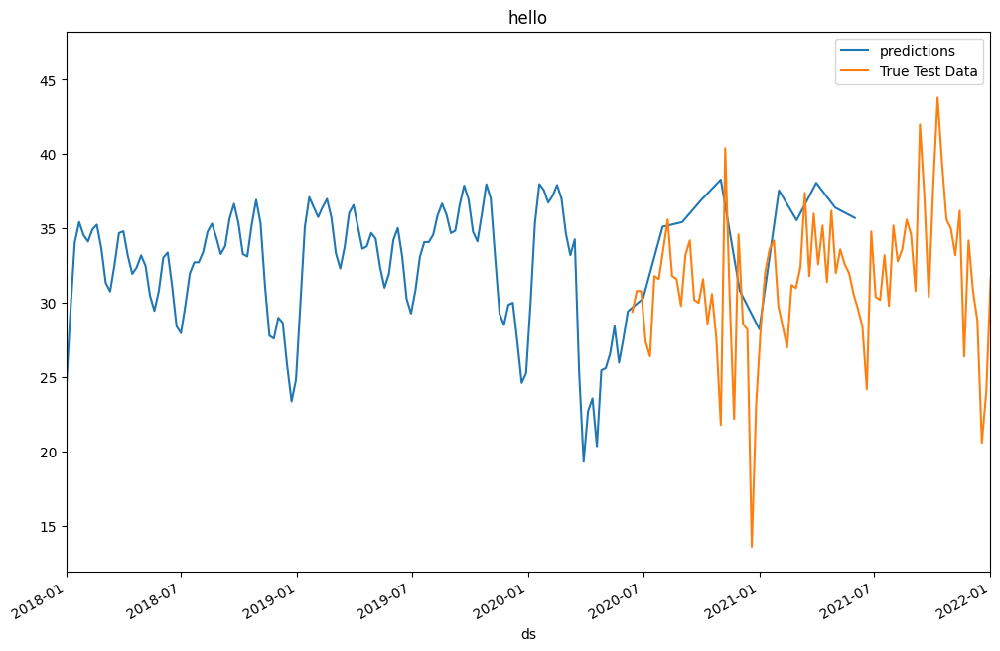

RMSE: 7


09:28:27 - cmdstanpy - INFO - Chain [1] start processing
09:28:27 - cmdstanpy - INFO - Chain [1] done processing


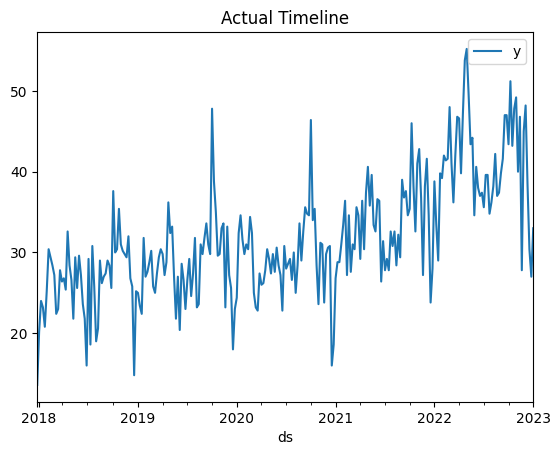

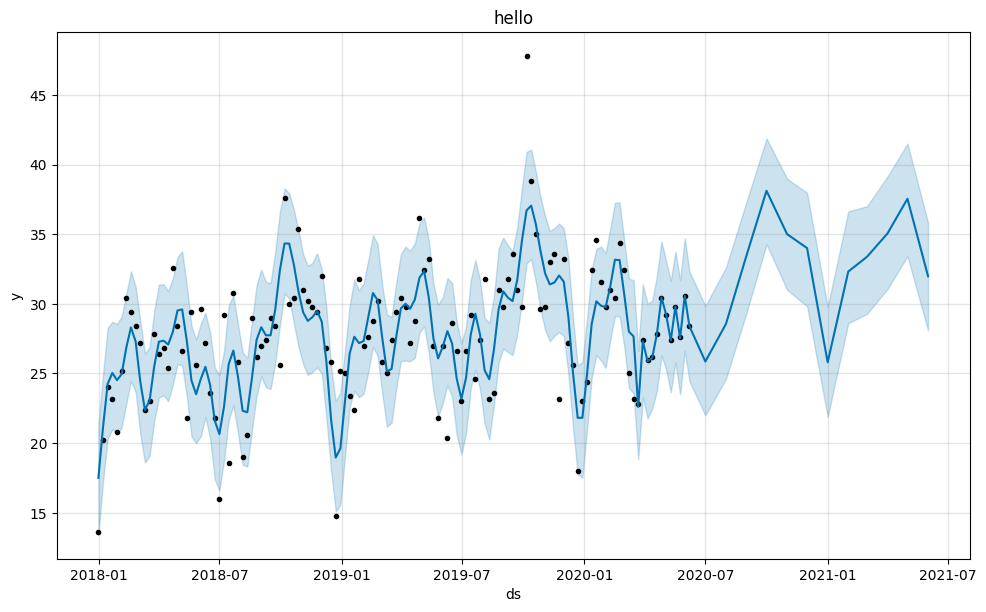

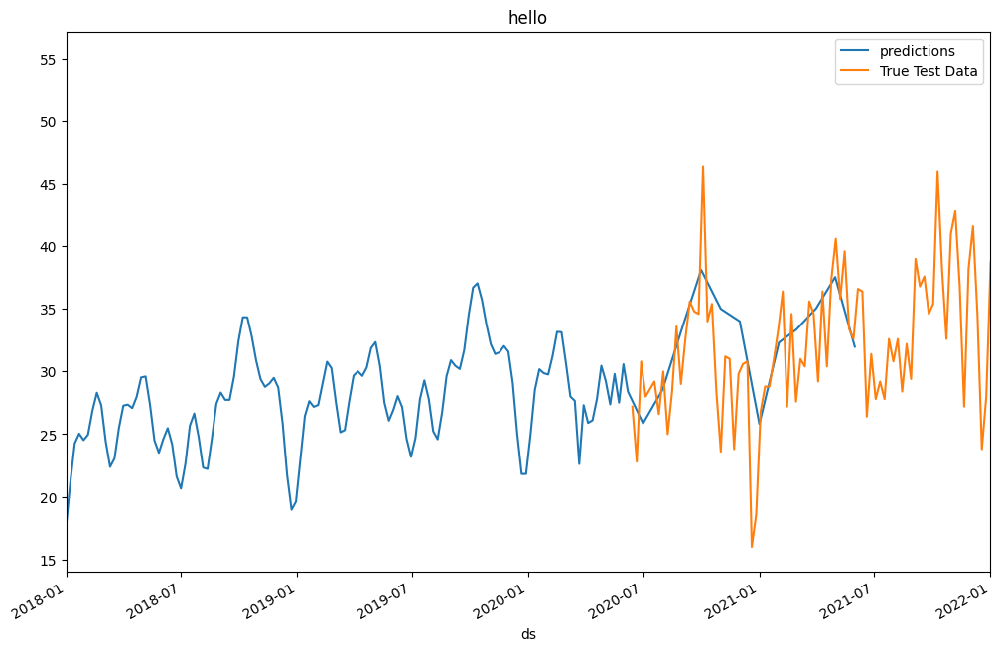

RMSE: 11


In [183]:
least_list= [least_depression,least_anxiety,least_addiction,least_counselling,least_mental_health]
search_list = ['Depression', 'Anxiety', 'Addiction', 'Counselling',
       'Mental_Health']

for item in least_list:

    item['ds']=pd.to_datetime(item.ds)

    item.plot(x='ds',y='y')
    plt.title(f"Actual Timeline")
    train=item[:128]
    test=item[128:]
    m=Prophet(holidays=most_lockdowns)
    m.fit(train)
    future=m.make_future_dataframe(periods=12,freq='MS')
    forecast=m.predict(future)
    m.plot(forecast)
    plt.title("hello")
    ax=forecast.plot(x='ds',y='yhat',legend=True,label='predictions',figsize=(12,8))
    test.plot(x='ds',y='y',legend=True,label='True Test Data',ax=ax,xlim=('2018-01-01','2022-01-01'))
    predictions = forecast.iloc[-len(test):]['yhat']
    actuals = test['y']
    plt.title("hello")
    plt.show()


    print(f"RMSE: {round(rmse(predictions, actuals))}")

### Least Restrictions without

09:26:59 - cmdstanpy - INFO - Chain [1] start processing
09:26:59 - cmdstanpy - INFO - Chain [1] done processing


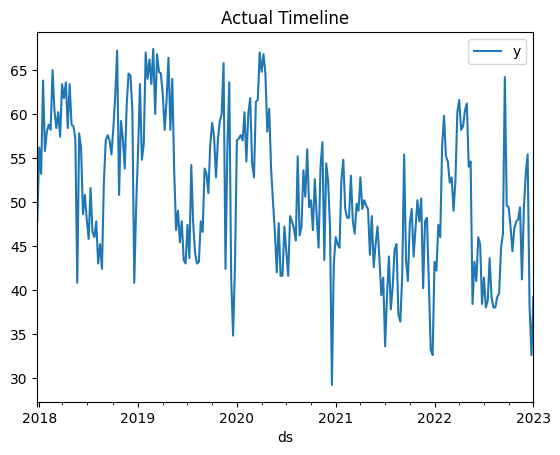

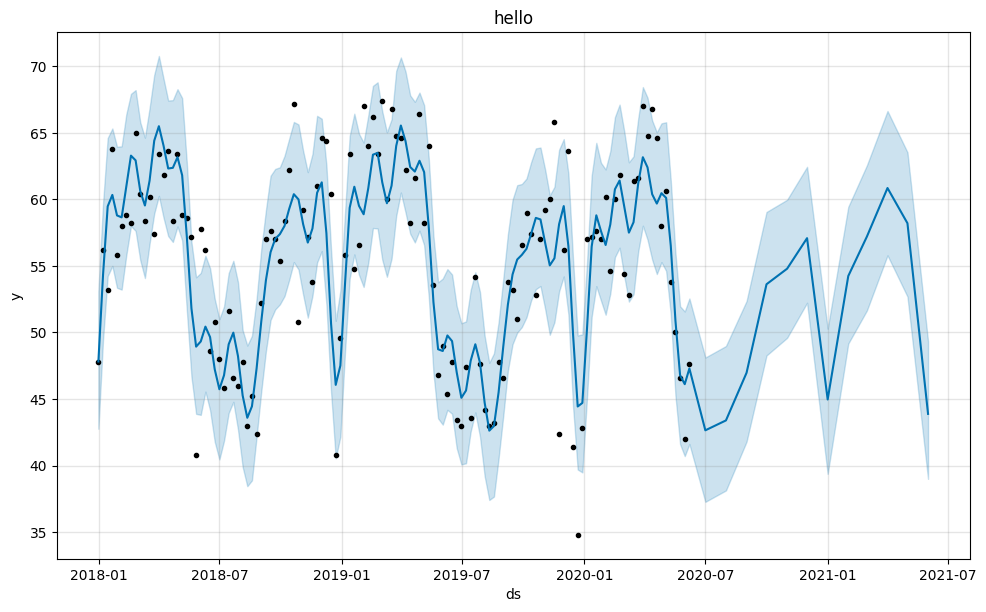

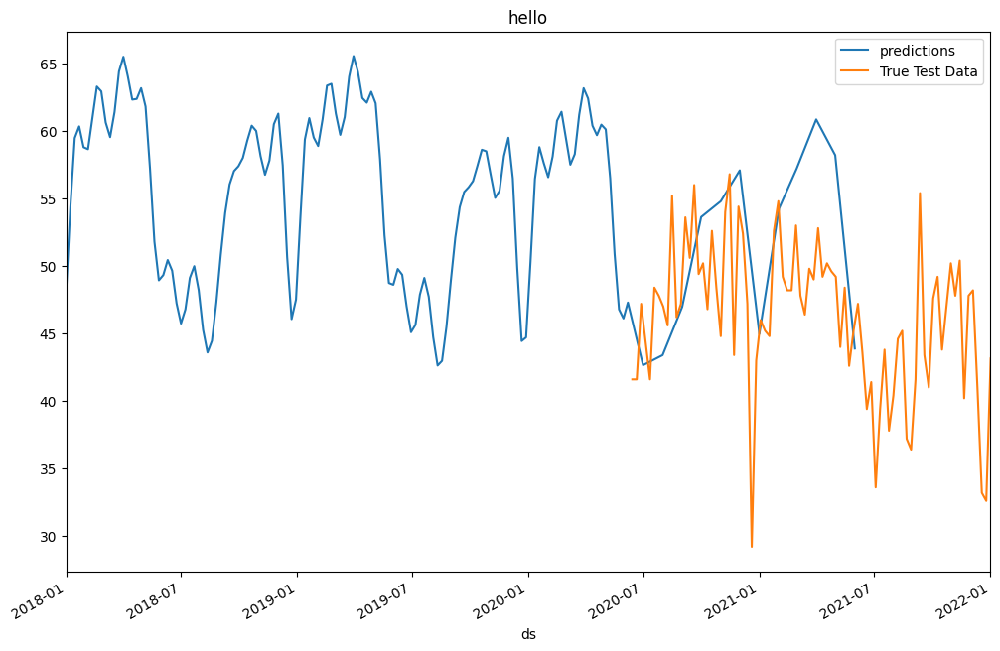

09:27:00 - cmdstanpy - INFO - Chain [1] start processing
09:27:00 - cmdstanpy - INFO - Chain [1] done processing


RMSE: 13


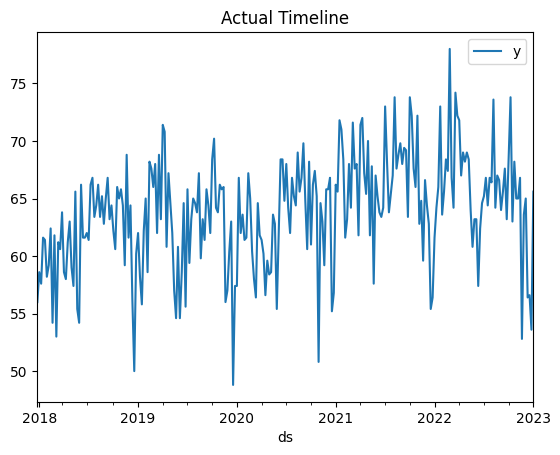

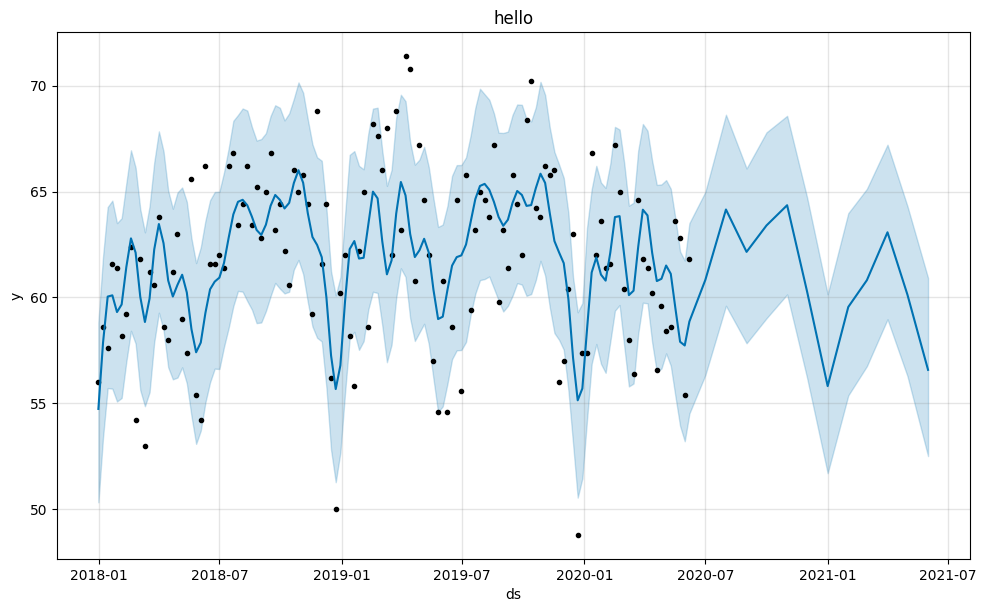

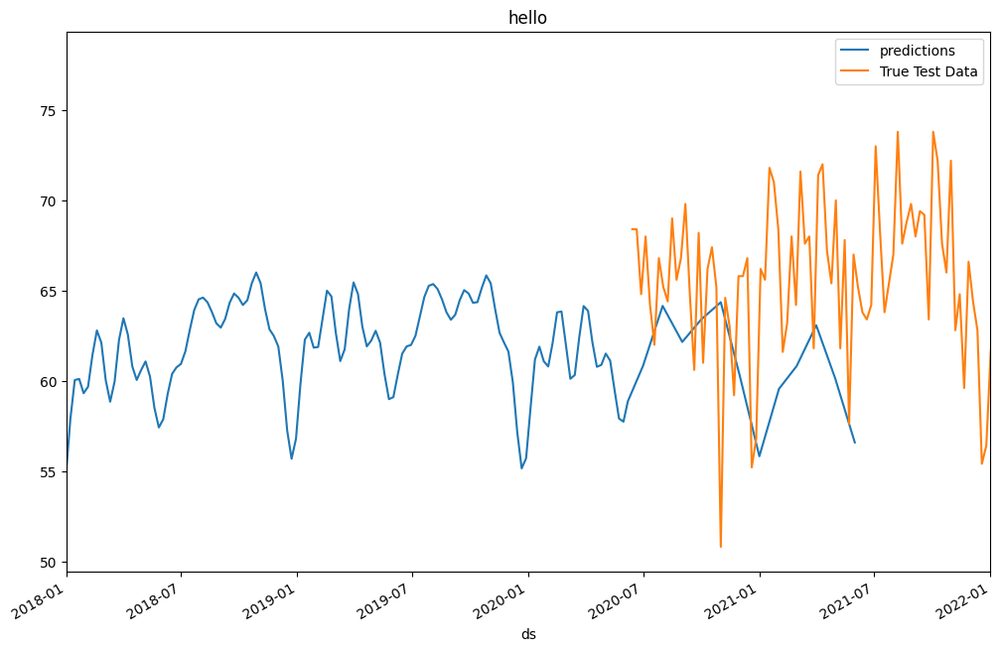

09:27:01 - cmdstanpy - INFO - Chain [1] start processing
09:27:01 - cmdstanpy - INFO - Chain [1] done processing


RMSE: 6


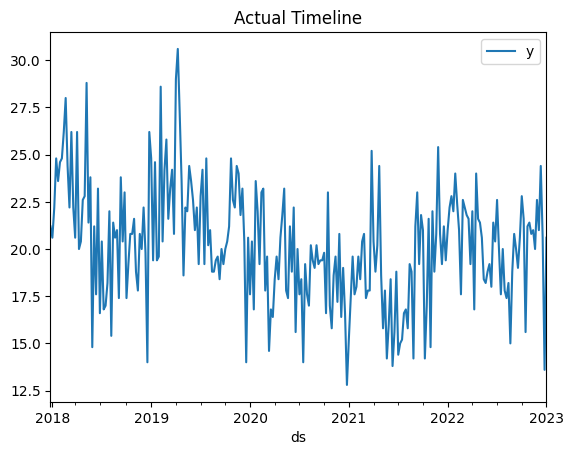

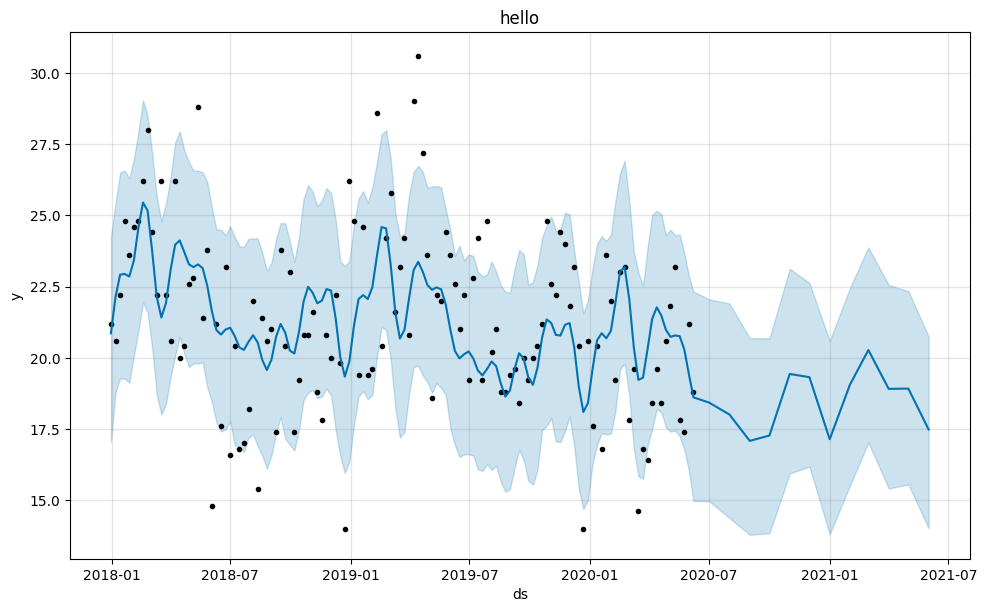

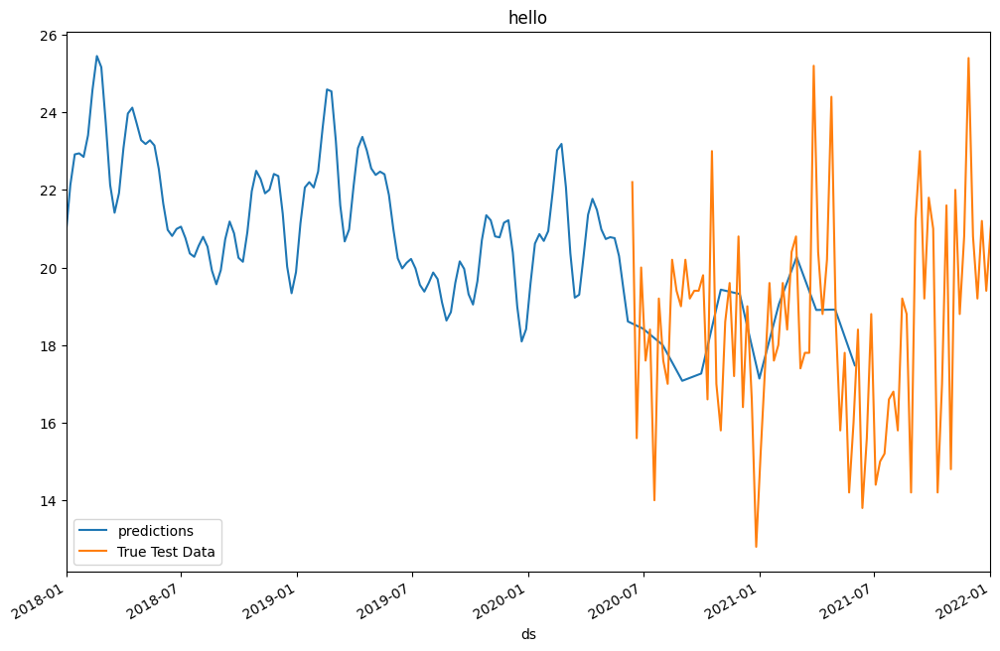

09:27:01 - cmdstanpy - INFO - Chain [1] start processing
09:27:02 - cmdstanpy - INFO - Chain [1] done processing


RMSE: 4


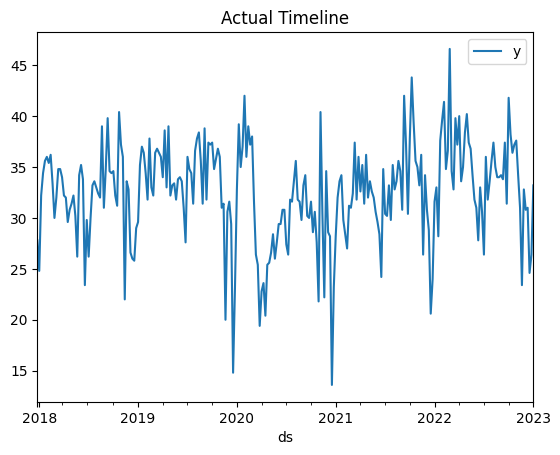

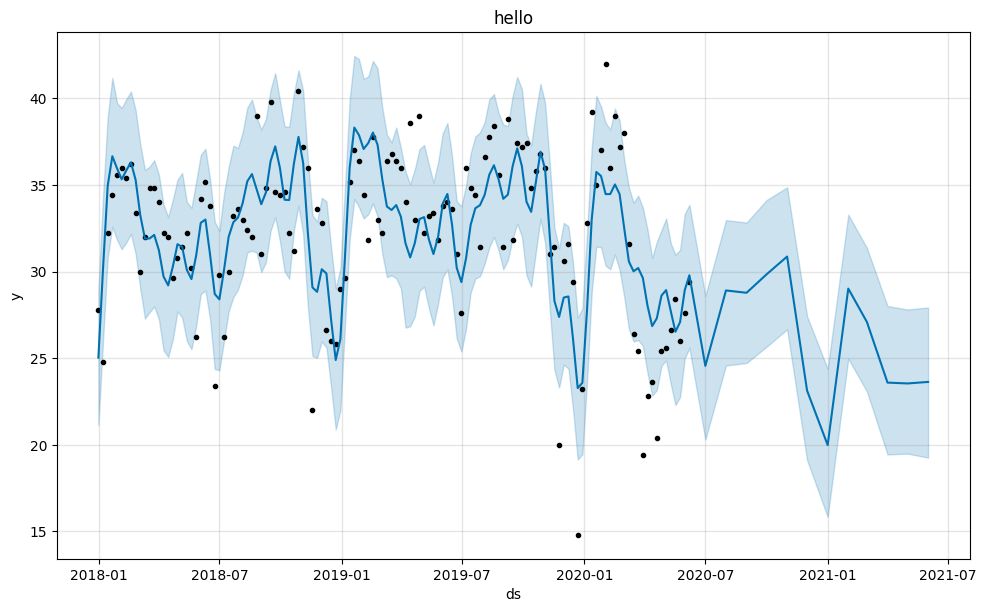

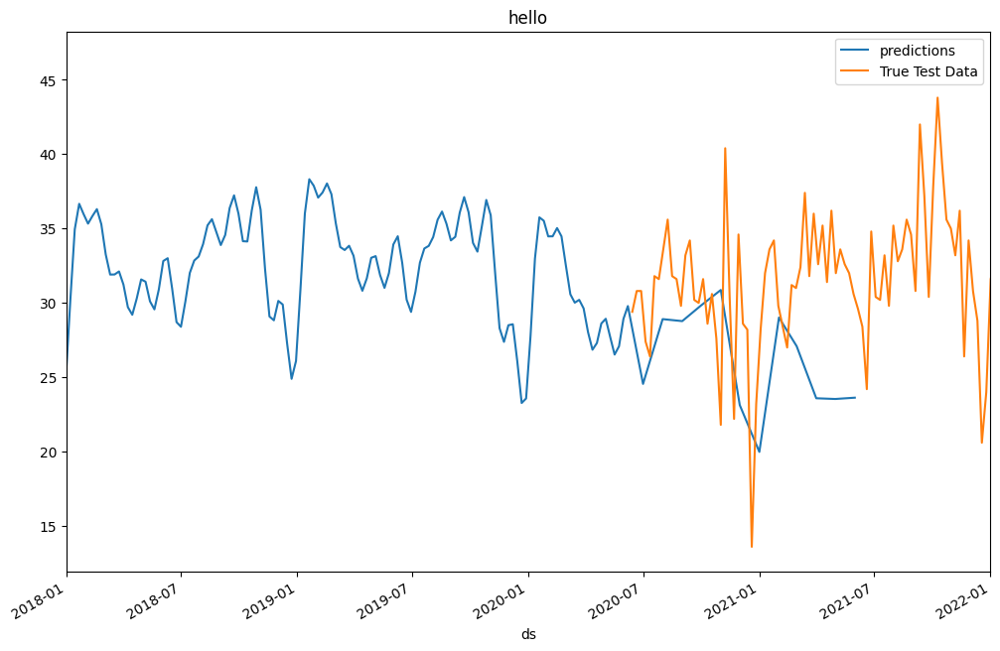

09:27:02 - cmdstanpy - INFO - Chain [1] start processing
09:27:02 - cmdstanpy - INFO - Chain [1] done processing


RMSE: 7


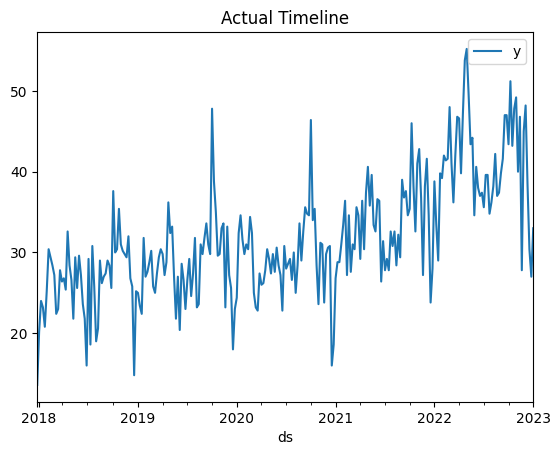

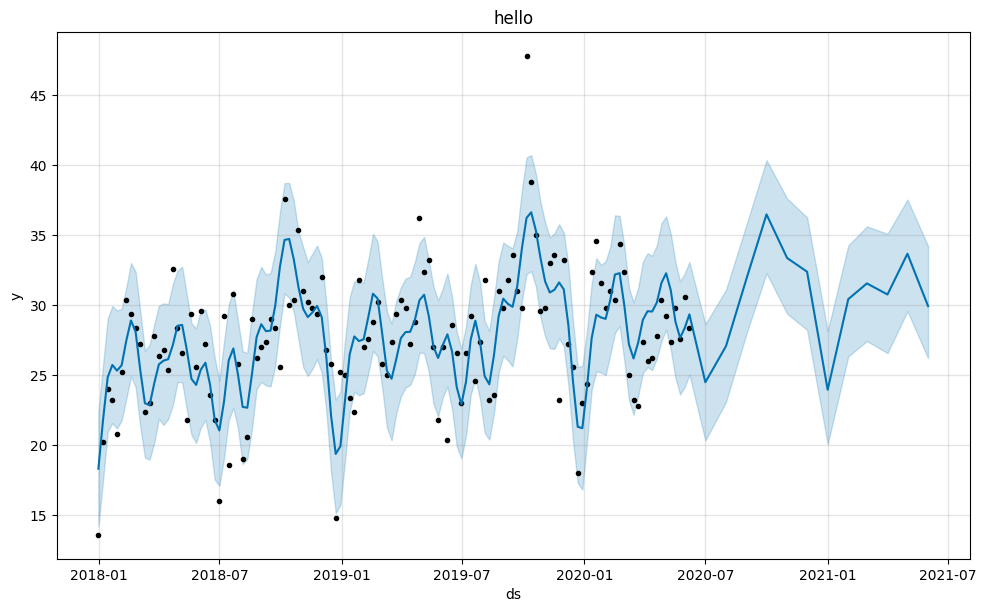

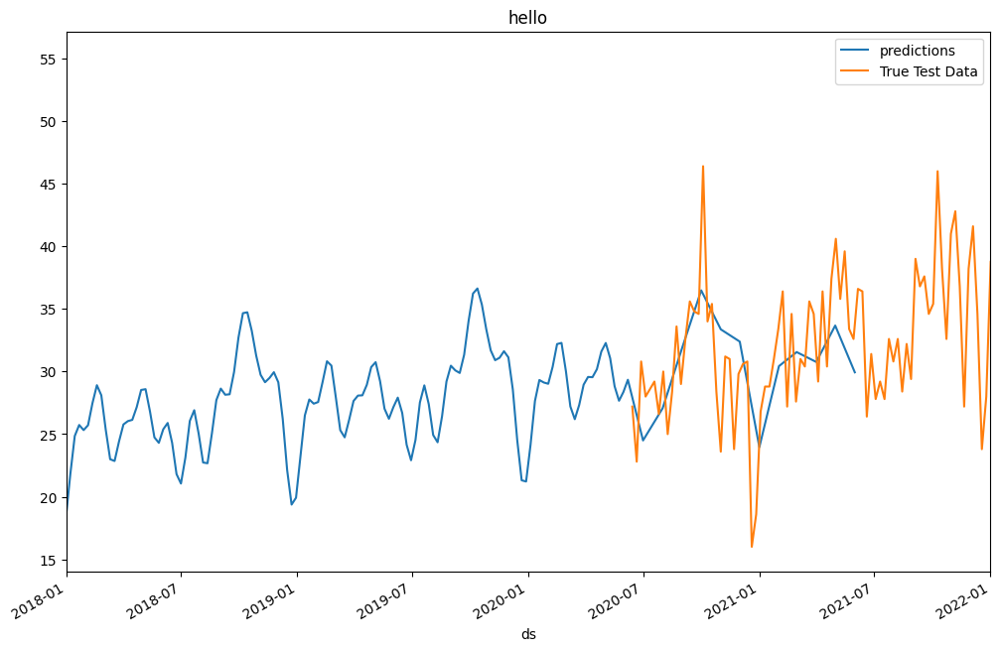

RMSE: 11


In [182]:
least_list= [least_depression,least_anxiety,least_addiction,least_counselling,least_mental_health]
search_list = ['Depression', 'Anxiety', 'Addiction', 'Counselling',
       'Mental_Health']

for item in least_list:

    item['ds']=pd.to_datetime(item.ds)

    item.plot(x='ds',y='y')
    plt.title(f"Actual Timeline")
    train=item[:128]
    test=item[128:]
    m=Prophet()
    m.fit(train)
    future=m.make_future_dataframe(periods=12,freq='MS')
    forecast=m.predict(future)
    m.plot(forecast)
    plt.title("hello")
    ax=forecast.plot(x='ds',y='yhat',legend=True,label='predictions',figsize=(12,8))
    test.plot(x='ds',y='y',legend=True,label='True Test Data',ax=ax,xlim=('2018-01-01','2022-01-01'))
    predictions = forecast.iloc[-len(test):]['yhat']
    actuals = test['y']
    plt.title("hello")
    plt.show()


    print(f"RMSE: {round(rmse(predictions, actuals))}")